## Load packages

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from brainspace.utils.parcellation import map_to_labels
import hcp_utils as hcp
from matplotlib.colors import ListedColormap
import scipy.stats as ss
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM
from neuroCombat import neuroCombat
import cmasher as cmr
import func_utils as fu
fdr = fu.fdr
se = fu.se
sub_corr = fu.sub_corr
plot_corr_bar = fu.plot_corr_bar
compare = fu.compare

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
cmap_brain = ListedColormap(np.vstack(([211/256, 211/256, 211/256, 1], fu.rgb)))
cmap = ListedColormap(fu.rgb)
ca = np.array(pd.read_csv('../data/ca_glasser_network.csv',header=None))[:,0].astype(float)
color = ca[:180]
datasite =['NYU','Pitt','USM', 'NYU_II','TCD']

In [3]:
mmp_ll = fu.mmp_ll
phen = fu.phen
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,ASD,TCD,15.50,98,2,5,0,0.165400
1,29099,ASD,TCD,10.75,123,3,5,0,0.148400
2,29101,ASD,TCD,14.00,103,3,4,0,0.248200
3,29103,ASD,TCD,14.75,108,4,3,0,0.161700
4,29104,ASD,TCD,19.25,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,ASD,USM,18.25,106,4,9,1,0.175961
279,32643,ASD,USM,16.92,84,1,11,0,0.122636
280,32646,ASD,USM,20.17,108,3,5,0,0.062141
281,32647,ASD,USM,32.55,126,4,6,0,0.121629


## LL part

In [4]:
variance = np.array(pd.read_csv('../results/grad/group_grad_LL_lambdas.csv',header=None))
explain = variance/np.sum(variance)
explain

array([[0.24128904],
       [0.18401363],
       [0.15086323],
       [0.09895598],
       [0.08759217],
       [0.07340464],
       [0.05616395],
       [0.04132282],
       [0.03446645],
       [0.03192809]])

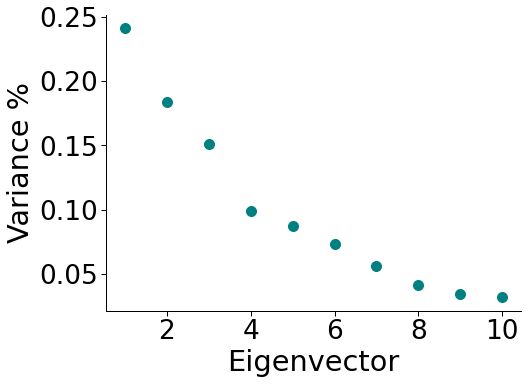

In [5]:
sns.set_context("paper", font_scale = 3)
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(range(1,11),explain,'o',color='teal', ms=10)
plt.xlabel('Eigenvector')
plt.ylabel('Variance %')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.savefig('../figures/template_explain.png', dpi=300, transparent=True)

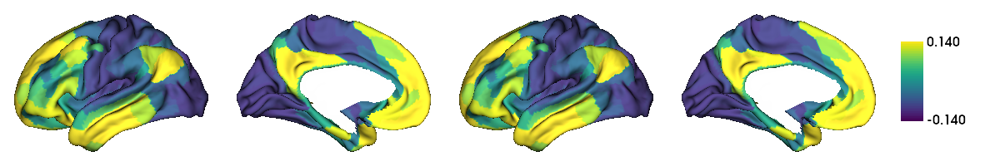

In [6]:
G1 = np.array(pd.read_csv('../results/grad/group_grad_LL.csv',header=None))[:,0]
mask = mmp_ll != 0
group_level = map_to_labels(np.concatenate((G1,G1)), mmp_ll, mask=mask)
group_level[group_level==0]=np.nan

fu.plot_surface_ll(data=group_level, size=(1200,200), cmap='viridis', color_range=(-0.14, 0.14), 
                   filename='../figures/group_grad_ll_g1.png')

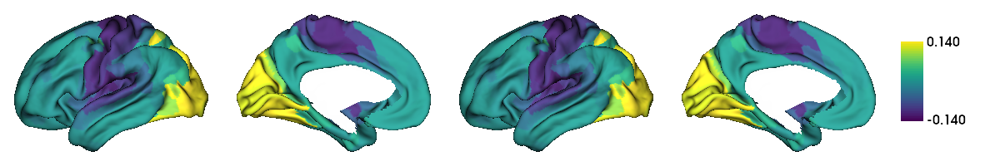

In [7]:
G2 = np.array(pd.read_csv('../results/grad/group_grad_LL.csv',header=None))[:,1]
group_level = map_to_labels(np.concatenate((G2,G2)), mmp_ll, mask=mask)
group_level[group_level==0]=np.nan
fu.plot_surface_ll(data=group_level, size=(1200,200), cmap='viridis', color_range=(-0.14, 0.14), 
                   filename='../figures/group_grad_ll_g2.png')

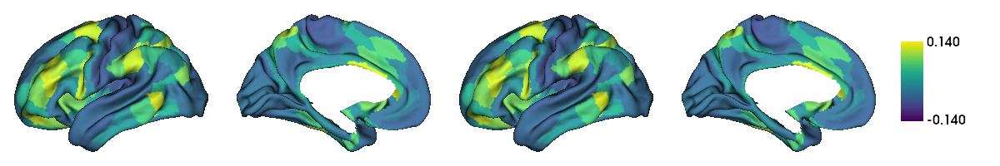

In [8]:
G3 = np.array(pd.read_csv('../results/grad/group_grad_LL.csv',header=None))[:,2]
group_level = map_to_labels(np.concatenate((G3,G3)), mmp_ll, mask=mask)
group_level[group_level==0]=np.nan

fu.plot_surface_ll(data=group_level, size=(1200,200), cmap='viridis', color_range=(-0.14, 0.14), 
                   filename='../figures/group_grad_ll_g3.png')

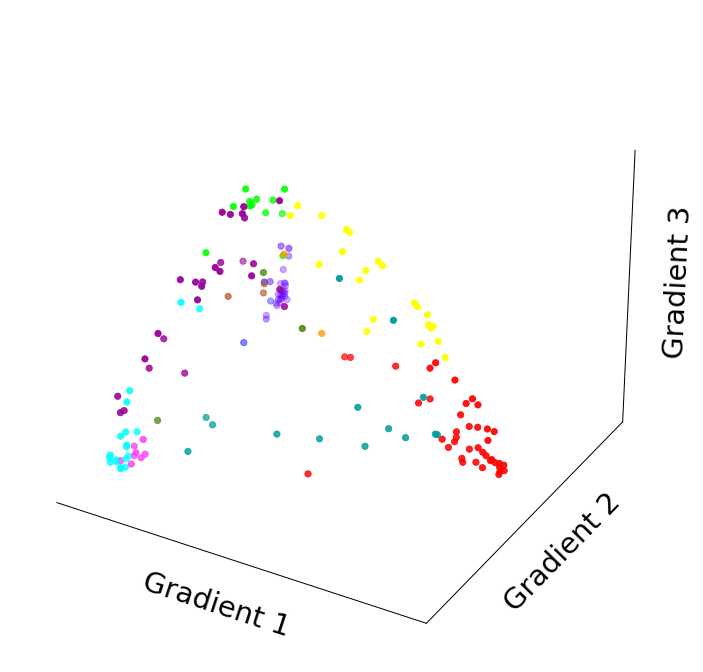

In [9]:
sns.set_context("paper", font_scale = 3)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.gca().patch.set_facecolor('white')
ax.w_xaxis.set_pane_color((1, 1, 1, 0))
ax.w_yaxis.set_pane_color((1, 1, 1, 0))
ax.w_zaxis.set_pane_color((1, 1, 1, 0))
ax.set_xticks(np.arange(-0.14, 0.14, 0.04))
ax.set_yticks(np.arange(-0.14, 0.14, 0.04))
ax.set_zticks(np.arange(-0.14, 0.14, 0.04))
ax.set_xlabel('Gradient 1',labelpad=10)
ax.set_ylabel('Gradient 2',labelpad=10)
ax.set_zlabel('Gradient 3',labelpad=10)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.grid(False)
ax.scatter(G1, G2, G3, s = 40, c = color, cmap=cmap, marker = 'o')
fig.tight_layout()
fig.savefig('../figures/hcp_template_3d.png', dpi=300, transparent=True)

In [10]:
path = '../results/grad/LL/'
path_list = os.listdir(path)
path_list.sort()
n = len(path_list)
LL = [None] * n
total = np.zeros((180,3))

for i in range(n):
  LL[i] = np.array(pd.read_csv(path+path_list[i], header=None))[:,:3]
  total += LL[i]

mean_LL = total/n

In [11]:
[mean_LL[:,0].max(), mean_LL[:,0].min(),
 mean_LL[:,1].max(), mean_LL[:,1].min(),
 mean_LL[:,2].max(), mean_LL[:,2].min()]

[0.1097549567409836,
 -0.07575455507346616,
 0.12585416669935828,
 -0.09316989405781906,
 0.07795355087701035,
 -0.046175430935104206]

In [12]:
[ss.pearsonr(G1, mean_LL[:,0]), fu.spin_pearson(G1, mean_LL[:,0]),
 ss.pearsonr(G2, mean_LL[:,1]), fu.spin_pearson(G2, mean_LL[:,1]),
 ss.pearsonr(G3, mean_LL[:,2]), fu.spin_pearson(G3, mean_LL[:,2])]

[(0.9536539562457202, 9.058511820677834e-95),
 0.0,
 (0.9553603412455292, 3.467887111978103e-96),
 0.0,
 (0.8813743896425423, 7.2518267873015e-60),
 0.0]

In [13]:
# cohen's d of HCP
hcp_cohen = \
[np.array(pd.read_csv('../../evolution/results/gradient/intra_g1_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g2_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g3_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g1_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g2_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g3_stats.csv'))[:,1]/pow(1014, 0.5)]

hcp_p = \
[np.array(pd.read_csv('../../evolution/results/gradient/intra_g1_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g2_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g3_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g1_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g2_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g3_stats.csv'))[:,2]]


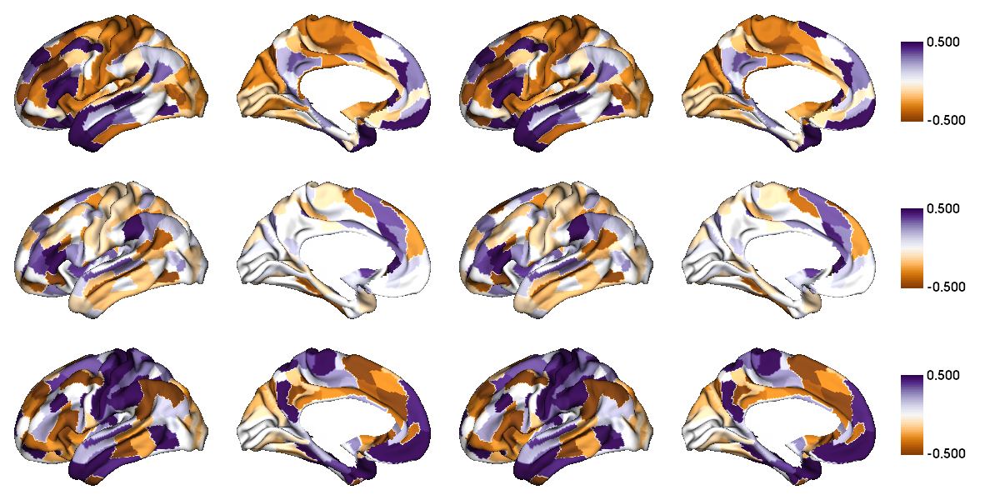

In [14]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  a = hcp_cohen[i].copy()
  a[fdr(hcp_p[i])>0.05] = 0.000001
  grad[i] = map_to_labels(np.concatenate((a,a)), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/hcp_cohen_intra.png')

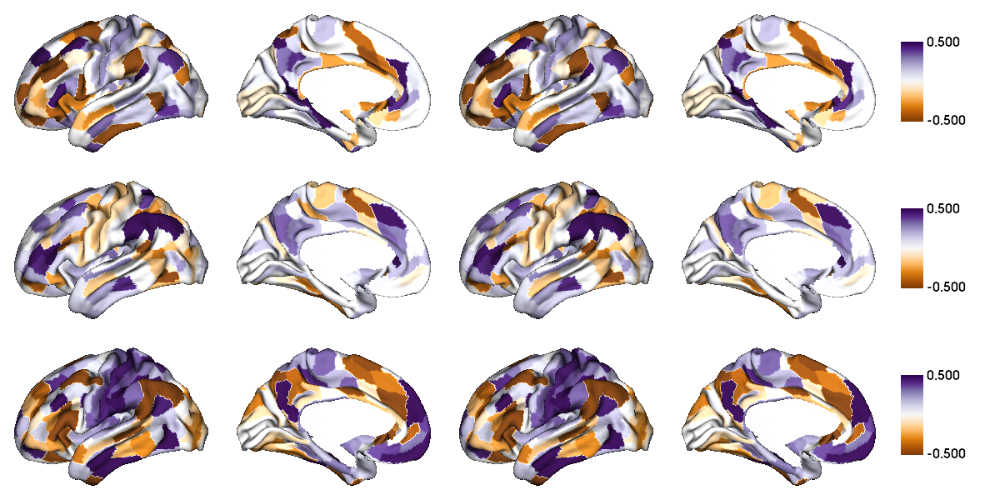

In [15]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  a = hcp_cohen[i+3].copy()
  a[fdr(hcp_p[i+3])>0.05] = 0.000001
  grad[i] = map_to_labels(np.concatenate((a,a)), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/hcp_cohen_inter.png')

## data harmony

In [16]:
def harmony(data):
    data_combat = neuroCombat(dat=data.T, mean_only= True,
                              covars=cov,
                              batch_col='site',
                              continuous_cols=['age'])['data']
    return data_combat.T

In [17]:
cov = phen[['site', 'age']]
cov

,site,age
0,TCD,15.50
1,TCD,10.75
2,TCD,14.00
3,TCD,14.75
4,TCD,19.25
...,...,...
278,USM,18.25
279,USM,16.92
280,USM,20.17
281,USM,32.55


# Intra asymmetry

In [18]:
path = '../results/grad/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


## ASD

In [19]:
asd_pos = np.where(phen['group']=='ASD')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/mean_sd_asd_intra.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

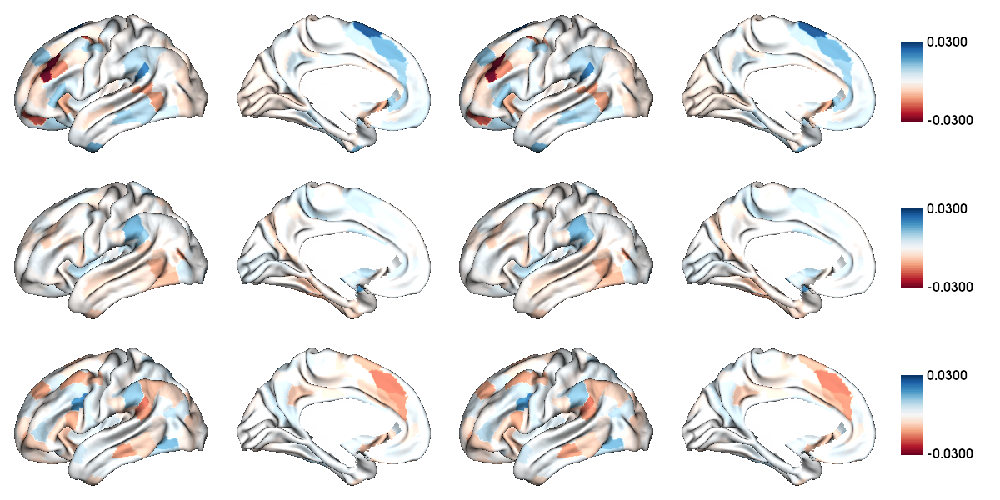

In [20]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/asd_intra_AI.png')

In [21]:
asd_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    asd_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
asd_stat.T[0] = asd_stat.T[0]/pow(matrix.shape[0], 0.5)
asd_stat.T[1].T[0] = fdr(asd_stat.T[1].T[0])
asd_stat.T[1].T[1] = fdr(asd_stat.T[1].T[1])
asd_stat.T[1].T[2] = fdr(asd_stat.T[1].T[2])
asd_stat.T[1][asd_stat.T[1]>0.05] = 1
np.savetxt('../results/asd_stat_intra_cohen_pfdr.csv', 
           np.concatenate((asd_stat.T[0],asd_stat.T[1]), axis=1))

asd_stat.T[0][asd_stat.T[1]>0.05] = 0.00001

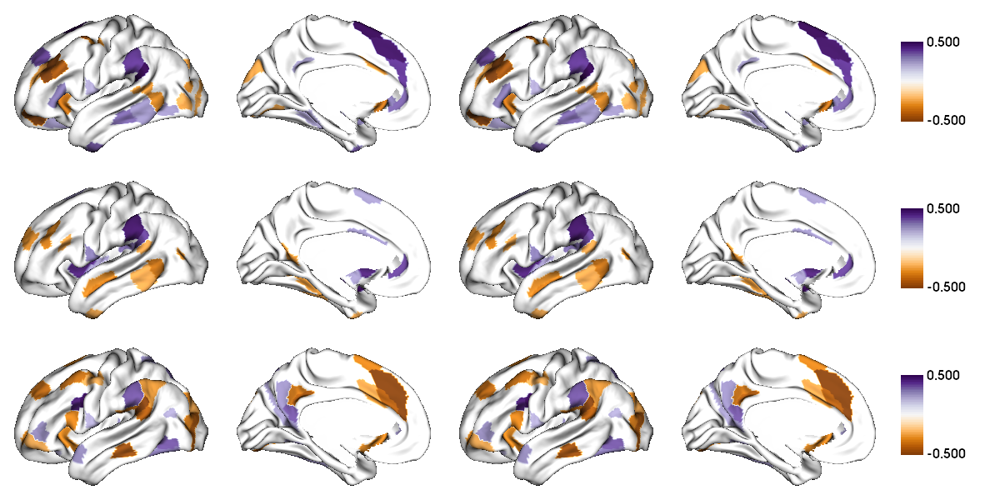

In [22]:
data = asd_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/asd_intra_cohen.png')

## Control

In [23]:
con_pos = np.where(phen['group']=='CONTROL')[0]
matrix = matrix_total[con_pos]
np.savetxt('../results/mean_sd_con_intra.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

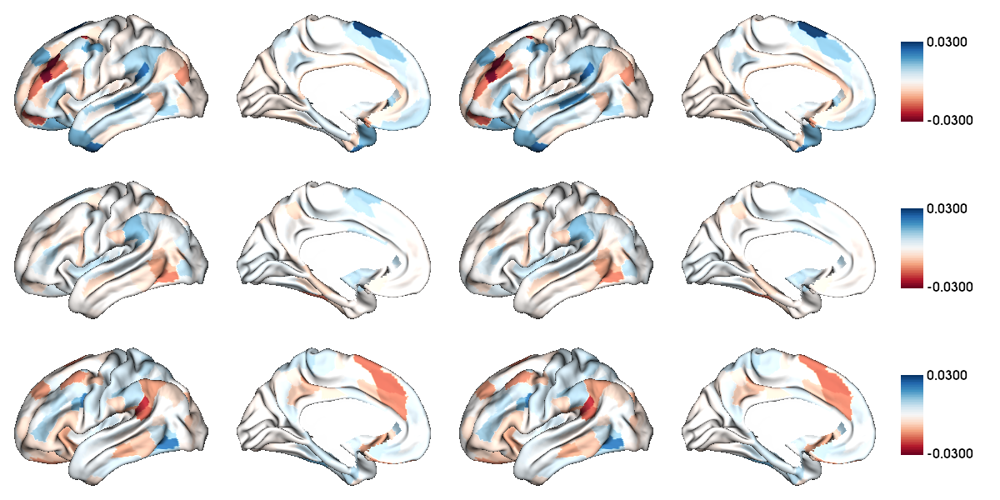

In [24]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/con_intra_AI.png')

In [25]:
con_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    con_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
con_stat.T[0] = con_stat.T[0]/pow(matrix.shape[0], 0.5)
con_stat.T[1].T[0] = fdr(con_stat.T[1].T[0])
con_stat.T[1].T[1] = fdr(con_stat.T[1].T[1])
con_stat.T[1].T[2] = fdr(con_stat.T[1].T[2])
con_stat.T[1][con_stat.T[1]>0.05] = 1
np.savetxt('../results/con_stat_intra_cohen_pfdr.csv', 
           np.concatenate((con_stat.T[0],con_stat.T[1]), axis=1))

con_stat.T[0][con_stat.T[1]>0.05] = 0.00001

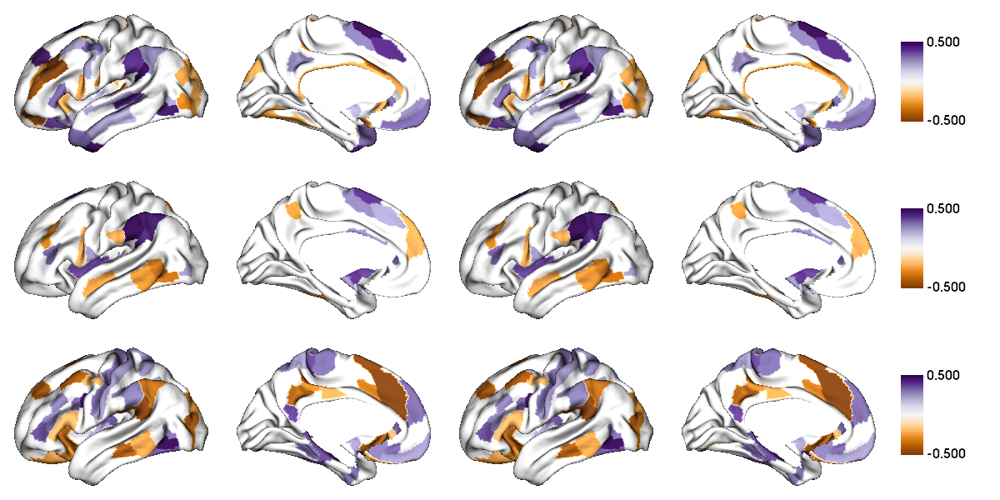

In [26]:
data = con_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/con_intra_cohen.png')

## Datasite

### stats

In [27]:
intra_asd_g1 = sub_corr(path = '../results/grad/intra/', group = 'ASD', grad=0)
intra_con_g1 = sub_corr(path = '../results/grad/intra/', group = 'CONTROL', grad=0)
compare(intra_asd_g1, intra_con_g1, '../results/compare_t_p_intra_g1.csv')

every_site: [Ttest_indResult(statistic=-0.7957325679757853, pvalue=0.42628859565137667), Ttest_indResult(statistic=-2.376644465624695, pvalue=0.017994610066424718), Ttest_indResult(statistic=-5.331326426240823, pvalue=1.1056211407044737e-07), Ttest_indResult(statistic=-2.312210681747943, pvalue=0.021215596369183385), Ttest_indResult(statistic=-0.11931574368170761, pvalue=0.9051254407957717)] 
 total: Ttest_indResult(statistic=-5.118887422213286, pvalue=3.198113763142863e-07)


separate: [[0.06986803351189477, 0.07945853459681912, 0.058058402777755924, 0.06718944147846738, 0.1318116527779049], [0.00543948438845342, 0.012795435127029664, 0.004053964062668163, 0.00895744201304052, 0.017748507709690074]] total: [0.06783292511386754, 0.0030087771220882833]


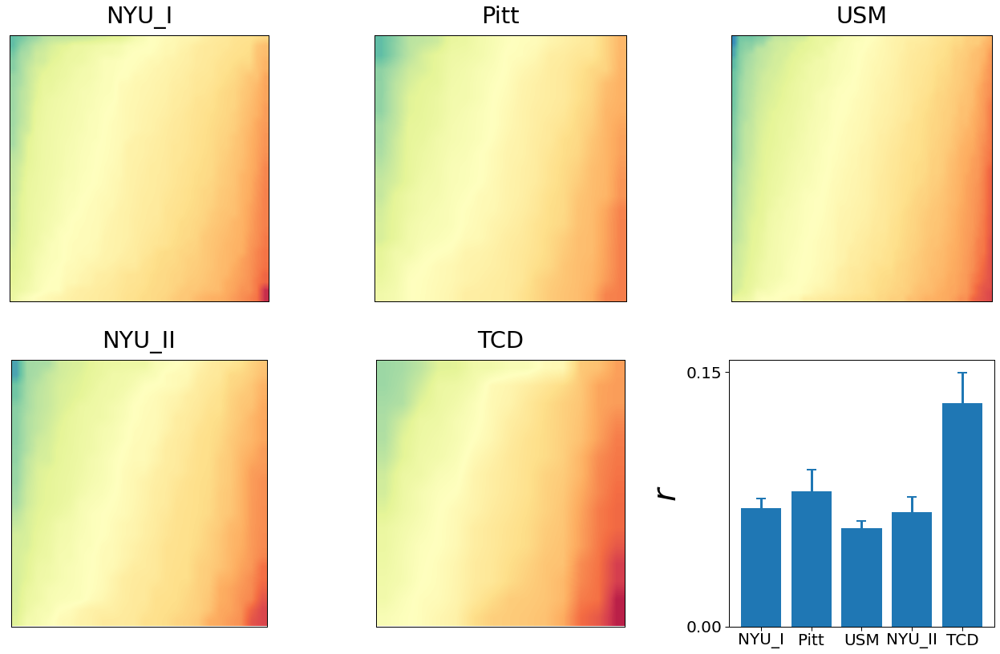

In [28]:
plot_corr_bar(intra_asd_g1, 'indi_asd_corr_intra_g1_site')

separate: [[0.06548652639919872, 0.10559347483074898, 0.09415849668966807, 0.10767360244225035, 0.12641452739685136], [0.0033564841124845406, 0.01200312378458702, 0.005093141353212136, 0.013430864776780077, 0.014753822298867396]] total: [0.08285989818859125, 0.002742156269327902]


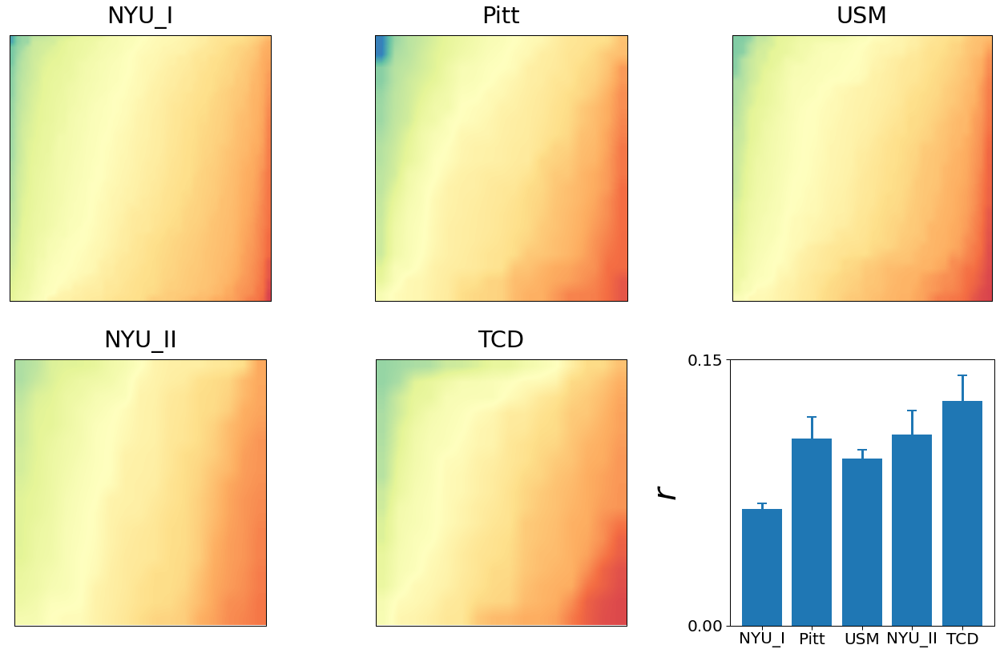

In [29]:
plot_corr_bar(intra_con_g1, 'indi_con_corr_intra_g1_site')

In [30]:
intra_asd_g2 = sub_corr(path = '../results/grad/intra/', group = 'ASD', grad=1)
intra_con_g2 = sub_corr(path = '../results/grad/intra/', group = 'CONTROL', grad=1)
compare(intra_asd_g2, intra_con_g2, '../results/compare_t_p_intra_g2.csv')

every_site: [Ttest_indResult(statistic=0.20724983759084212, pvalue=0.8358373367691732), Ttest_indResult(statistic=1.2692494682684163, pvalue=0.20517433278783806), Ttest_indResult(statistic=0.10194618710050278, pvalue=0.9188114187245393), Ttest_indResult(statistic=-1.595311355847536, pvalue=0.11134310084567013), Ttest_indResult(statistic=0.713788626167122, pvalue=0.4760543561179317)] 
 total: Ttest_indResult(statistic=0.2614012857204316, pvalue=0.7937947075801599)


separate: [[0.05333611761910793, 0.08289325029726362, 0.051543822758501195, 0.044067593561805, 0.08757738087648484], [0.005647982322920106, 0.012882446329188082, 0.004113959554235574, 0.00912833068402383, 0.018160774503872115]] total: [0.055266936087663684, 0.0030671434326808838]


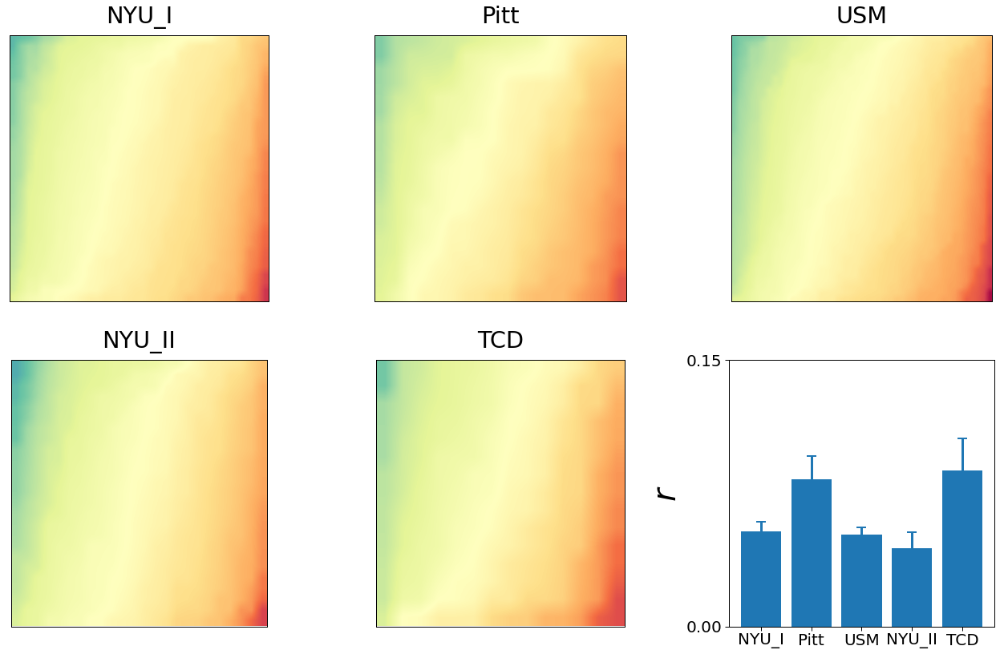

In [31]:
plot_corr_bar(intra_asd_g2, 'indi_asd_corr_intra_g2_site')

separate: [[0.043448381474320535, 0.06564858258035647, 0.05605310881822209, 0.07754835340184994, 0.0684932853474731], [0.0034572831029630493, 0.01207751335572829, 0.005360114134054037, 0.014012587962804067, 0.01573587003408654]] total: [0.05236315576693065, 0.0028359067848916955]


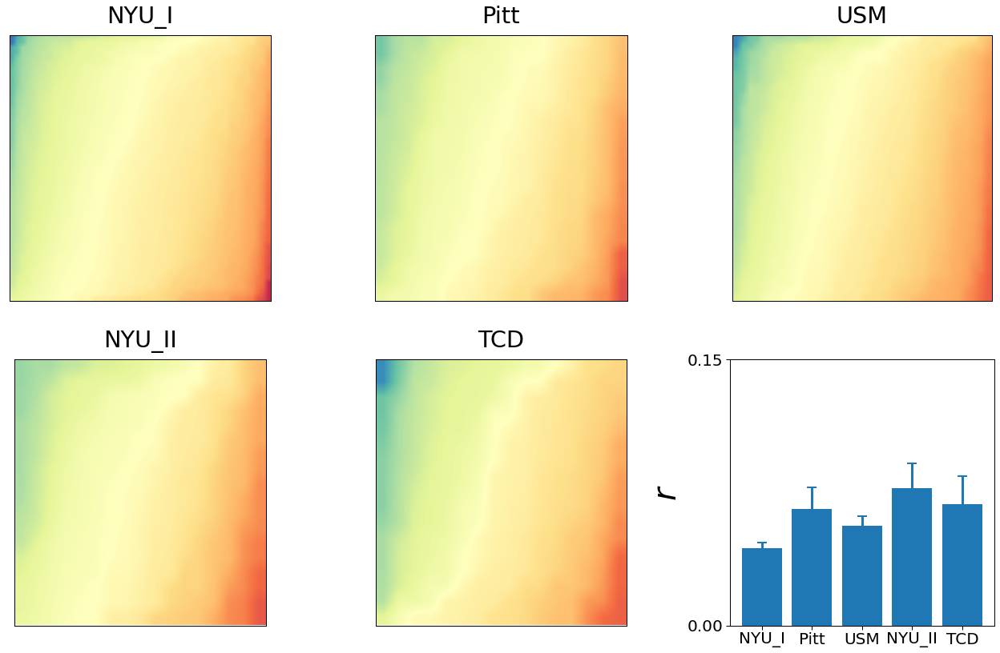

In [32]:
plot_corr_bar(intra_con_g2, 'indi_con_corr_intra_g2_site')

In [33]:
intra_asd_g3 = sub_corr(path = '../results/grad/intra/', group = 'ASD', grad=2)
intra_con_g3 = sub_corr(path = '../results/grad/intra/', group = 'CONTROL', grad=2)
compare(intra_asd_g3, intra_con_g3, '../results/compare_t_p_intra_g3.csv')

every_site: [Ttest_indResult(statistic=-0.3091288431098805, pvalue=0.7572579937820617), Ttest_indResult(statistic=-3.0907918395428107, pvalue=0.0021521649183658884), Ttest_indResult(statistic=-6.705454491869892, pvalue=2.7245736937779866e-11), Ttest_indResult(statistic=0.8423266654279651, pvalue=0.40005158272197794), Ttest_indResult(statistic=2.054481714103996, pvalue=0.04101669455934312)] 
 total: Ttest_indResult(statistic=-5.20062923298658, pvalue=2.07190557870981e-07)


separate: [[0.07899652308760081, 0.08053458586453253, 0.046672456904771384, 0.09554864167873922, 0.12552527424193838], [0.005399441970225062, 0.012820961396817567, 0.0040058040831072025, 0.008634836126636703, 0.01722329393347028]] total: [0.06866514341905791, 0.0029746100037949825]


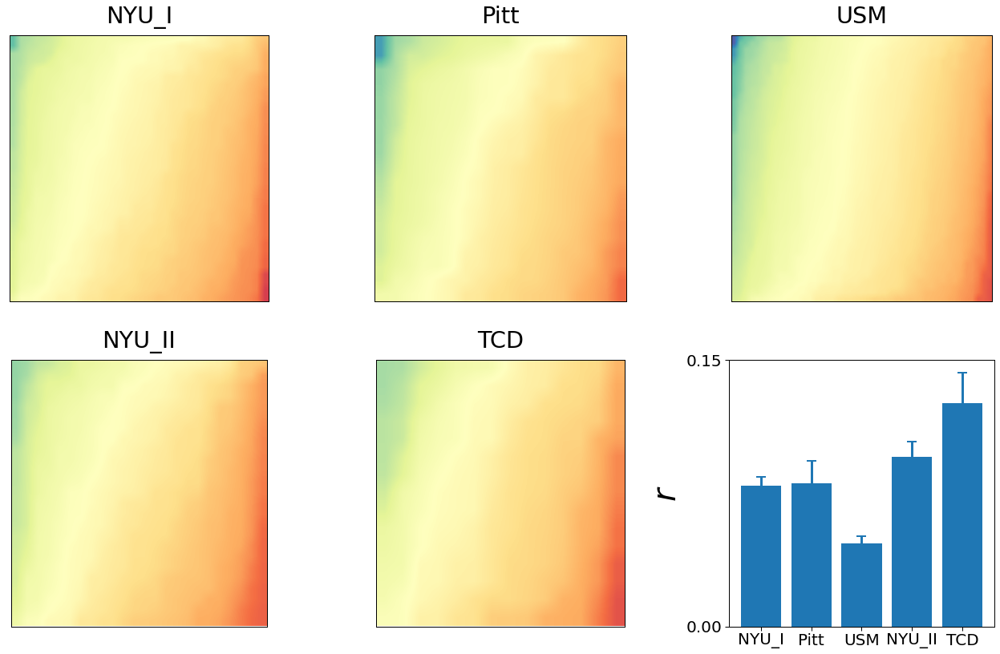

In [34]:
plot_corr_bar(intra_asd_g3, 'indi_asd_corr_intra_g3_site')

separate: [[0.0720528419862837, 0.11288383797557415, 0.09051661083702599, 0.10089473350331177, 0.09124774126555334], [0.0032521106286779343, 0.011550168292706314, 0.005208449619665378, 0.013874888637828124, 0.014603002817145966]] total: [0.08339167335204899, 0.0027104805997772018]


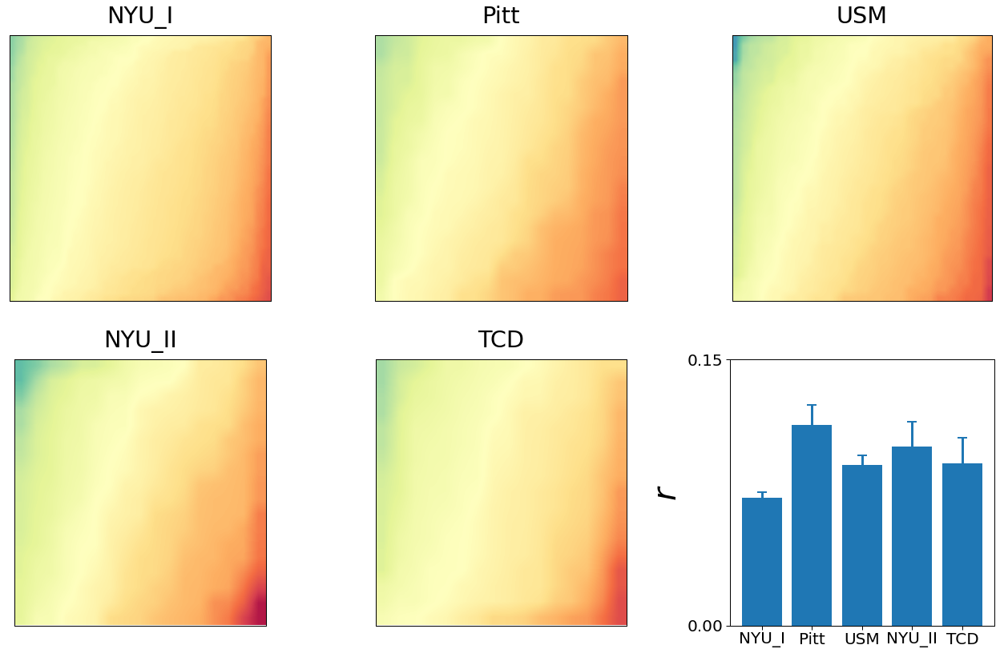

In [35]:
plot_corr_bar(intra_con_g3, 'indi_con_corr_intra_g3_site')

# Inter asymmetry

In [36]:
path = '../results/grad/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


## ASD

In [37]:
asd_pos = np.where(phen['group']=='ASD')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/mean_sd_asd_inter.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

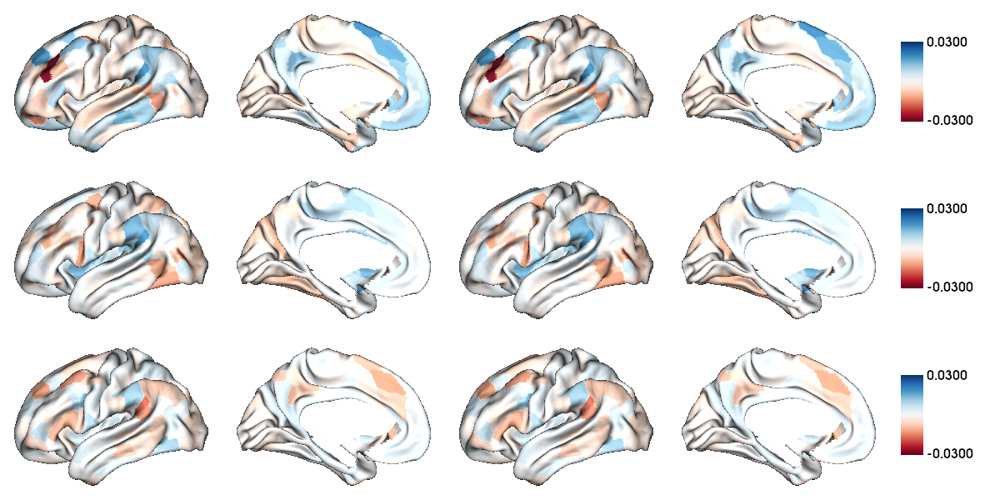

In [38]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/asd_inter_AI.png')

In [39]:
asd_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    asd_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
asd_stat.T[0] = asd_stat.T[0]/pow(matrix.shape[0], 0.5)
asd_stat.T[1].T[0] = fdr(asd_stat.T[1].T[0])
asd_stat.T[1].T[1] = fdr(asd_stat.T[1].T[1])
asd_stat.T[1].T[2] = fdr(asd_stat.T[1].T[2])
asd_stat.T[1][asd_stat.T[1]>0.05] = 1
np.savetxt('../results/asd_stat_inter_cohen_pfdr.csv', 
           np.concatenate((asd_stat.T[0],asd_stat.T[1]), axis=1))

asd_stat.T[0][asd_stat.T[1]>0.05] = 0.00001

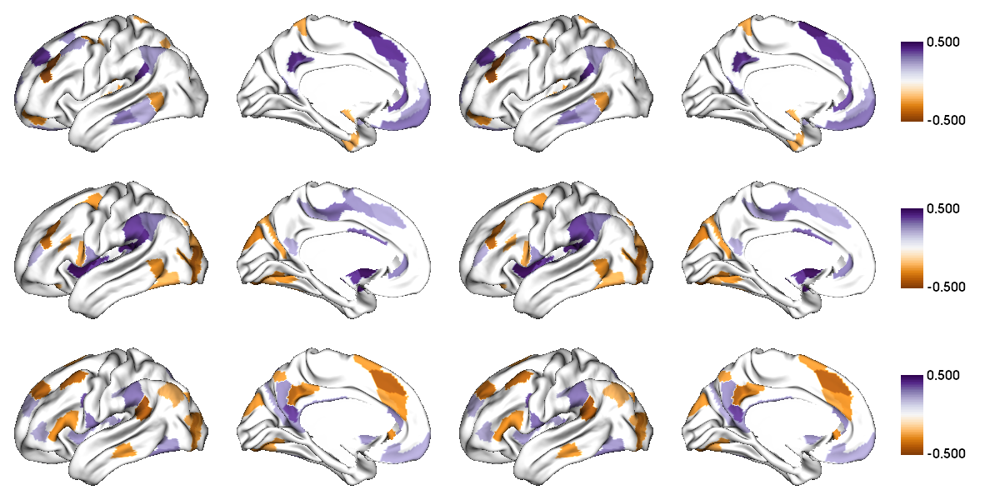

In [40]:
data = asd_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/asd_inter_cohen.png')

## Control

In [41]:
asd_pos = np.where(phen['group']=='CONTROL')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/mean_sd_con_inter.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)),axis=1))

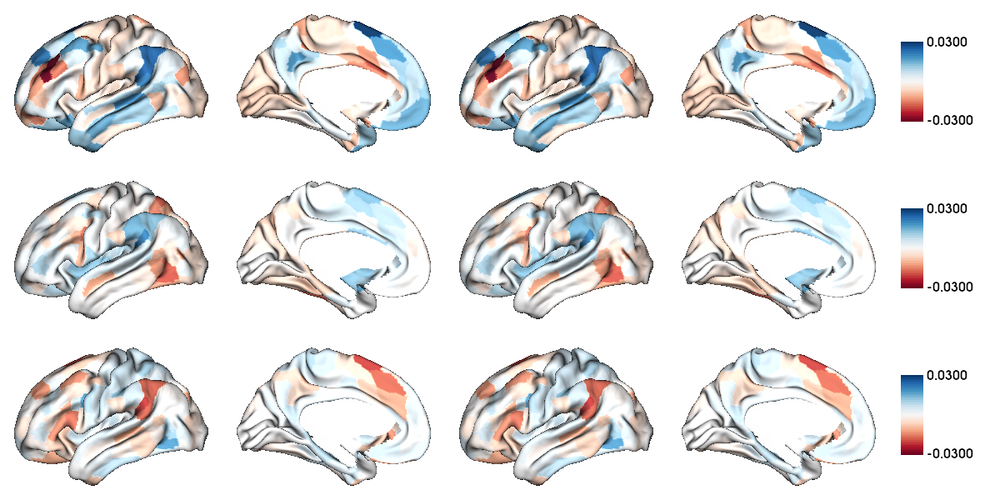

In [42]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/con_inter_AI.png')

In [43]:
con_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    con_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
con_stat.T[0] = con_stat.T[0]/pow(matrix.shape[0], 0.5)
con_stat.T[1].T[0] = fdr(con_stat.T[1].T[0])
con_stat.T[1].T[1] = fdr(con_stat.T[1].T[1])
con_stat.T[1].T[2] = fdr(con_stat.T[1].T[2])
con_stat.T[1][con_stat.T[1]>0.05] = 1
np.savetxt('../results/con_stat_inter_cohen_pfdr.csv', 
           np.concatenate((con_stat.T[0],con_stat.T[1]), axis=1))

con_stat.T[0][con_stat.T[1]>0.05] = 0.00001

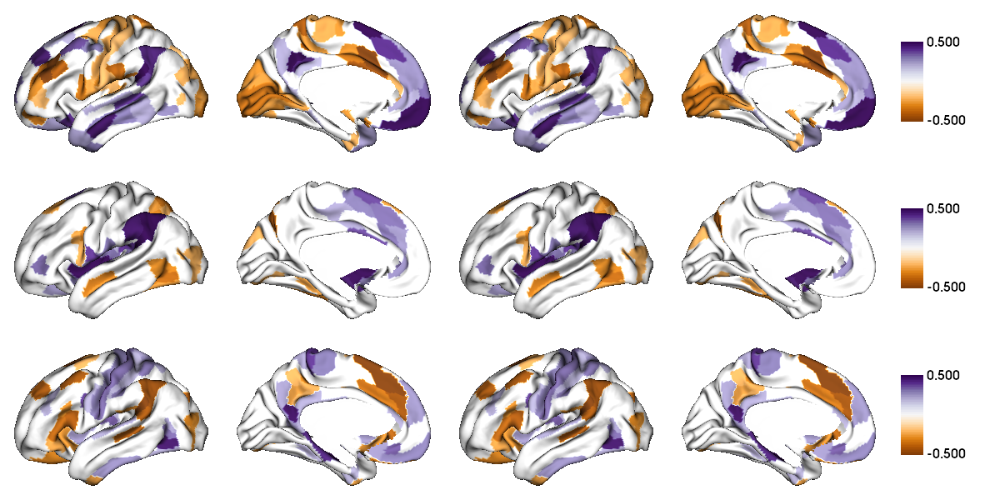

In [44]:
data = con_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/con_inter_cohen.png')

## Datasites

### Stats

In [45]:
inter_asd_g1 = sub_corr(path = '../results/grad/inter/', group = 'ASD', grad=0)
inter_con_g1 = sub_corr(path = '../results/grad/inter/', group = 'CONTROL', grad=0)
compare(inter_asd_g1, inter_con_g1, '../results/compare_t_p_inter_g1.csv')

every_site: [Ttest_indResult(statistic=-2.0777610763208334, pvalue=0.03786766725504465), Ttest_indResult(statistic=-2.826951131323889, pvalue=0.004962593174273747), Ttest_indResult(statistic=-5.2917056983719, pvalue=1.36930080120109e-07), Ttest_indResult(statistic=-1.5348265179327258, pvalue=0.1255276442572891), Ttest_indResult(statistic=-0.9511899472923714, pvalue=0.3424688744434392)] 
 total: Ttest_indResult(statistic=-6.539996918299923, pvalue=6.818500300886253e-11)


separate: [[0.06365073679268234, 0.07530807405781381, 0.047242997677261596, 0.059495057692069205, 0.11211114652717974], [0.005679703436908565, 0.013316321816619287, 0.0040148968074684285, 0.009190042169736458, 0.019011430762226385]] total: [0.05877284038162366, 0.0030740105417155997]


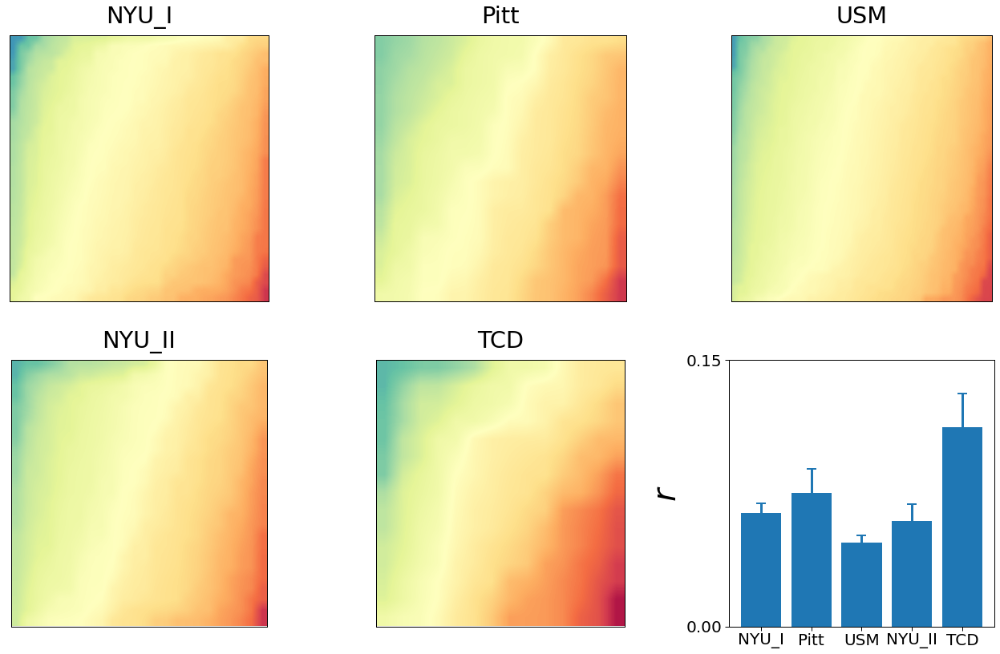

In [46]:
plot_corr_bar(inter_asd_g1, 'indi_asd_corr_inter_g1_site')

separate: [[0.06743194924379148, 0.11230825773508694, 0.08327724791222071, 0.09238267379410985, 0.1224678321368971], [0.0035414206736824583, 0.012445541866218896, 0.005271822634436208, 0.013595590196315184, 0.015338677828195169]] total: [0.08020179515669705, 0.0028519800477848855]


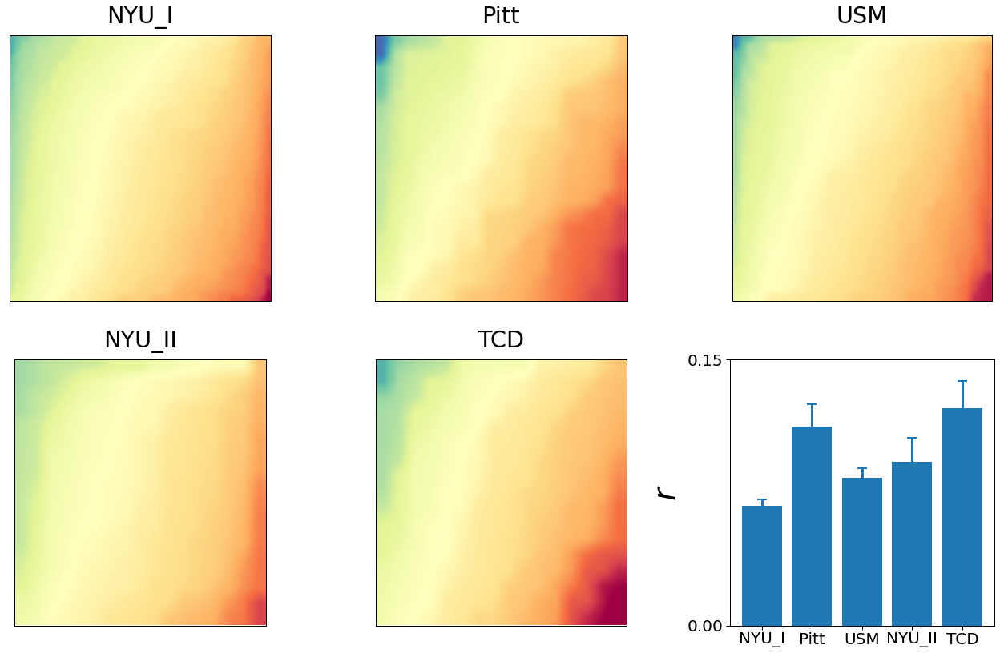

In [47]:
plot_corr_bar(inter_con_g1, 'indi_con_corr_inter_g1_site')

In [48]:
inter_asd_g2 = sub_corr(path = '../results/grad/inter/', group = 'ASD', grad=1)
inter_con_g2 = sub_corr(path = '../results/grad/inter/', group = 'CONTROL', grad=1)
compare(inter_asd_g2, inter_con_g2, '../results/compare_t_p_inter_g2.csv')

every_site: [Ttest_indResult(statistic=-1.08627409373791, pvalue=0.2774978986791597), Ttest_indResult(statistic=-3.160484136088223, pvalue=0.0017089270582101286), Ttest_indResult(statistic=-1.4734992584876336, pvalue=0.14080170411638238), Ttest_indResult(statistic=-2.6159048924808785, pvalue=0.009197606006111053), Ttest_indResult(statistic=1.9999746801860288, pvalue=0.04663474701190615)] 
 total: Ttest_indResult(statistic=-2.5612428446885853, pvalue=0.010461292121169113)


separate: [[0.05213083551931149, 0.07073768150668992, 0.04740304456847514, 0.0529486408573834, 0.13103194231782828], [0.005590883789967059, 0.012661384386024786, 0.004152850835323524, 0.009118771950208526, 0.01809142455950955]] total: [0.05542102513166543, 0.0030706785532222023]


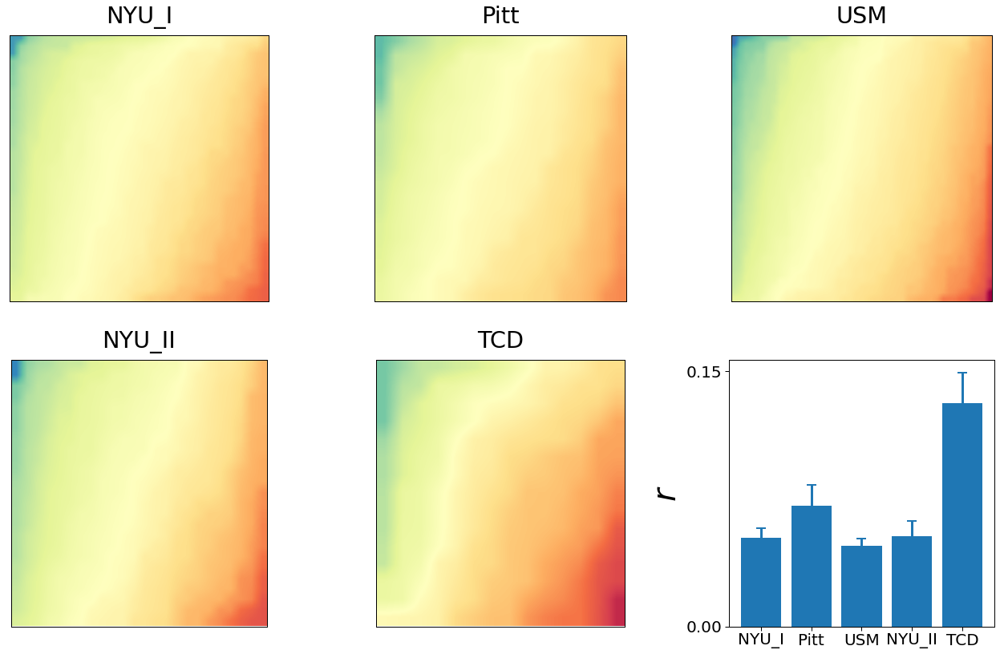

In [49]:
plot_corr_bar(inter_asd_g2, 'indi_asd_corr_inter_g2_site')

separate: [[0.049369751437704466, 0.10204551981440668, 0.062310200957639506, 0.09815854167025824, 0.0879125751200322], [0.0034476550411351985, 0.011658331015548544, 0.0057867763371861735, 0.013749022271347562, 0.01585419624574563]] total: [0.06256104720792564, 0.002888755638166176]


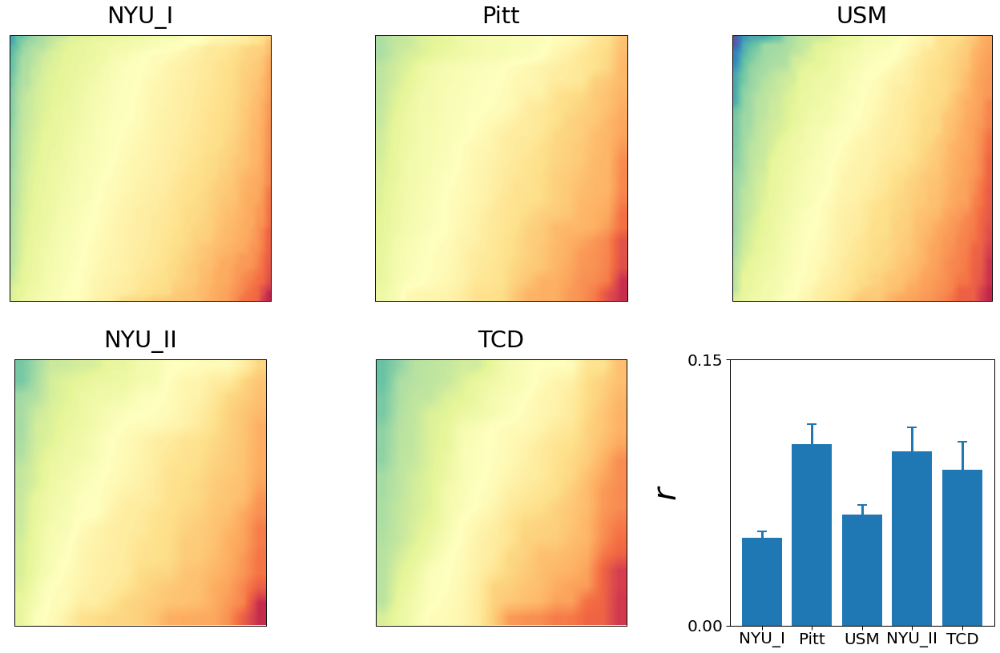

In [50]:
plot_corr_bar(inter_con_g2, 'indi_con_corr_inter_g2_site')

In [51]:
inter_asd_g3 = sub_corr(path = '../results/grad/inter/', group = 'ASD', grad=2)
inter_con_g3 = sub_corr(path = '../results/grad/inter/', group = 'CONTROL', grad=2)
compare(inter_asd_g3, inter_con_g3, '../results/compare_t_p_inter_g3.csv')

every_site: [Ttest_indResult(statistic=-2.4958317882332923, pvalue=0.012651866065395614), Ttest_indResult(statistic=-3.9154972101543786, pvalue=0.00010796965374010729), Ttest_indResult(statistic=-7.24294559842384, pvalue=6.628064786760655e-13), Ttest_indResult(statistic=-0.5245416323052907, pvalue=0.6001595882678809), Ttest_indResult(statistic=1.7580200738147471, pvalue=0.08002414913298043)] 
 total: Ttest_indResult(statistic=-7.327270477401855, pvalue=2.757459441008133e-13)


separate: [[0.058091328423203664, 0.06913318024747657, 0.03768612230415431, 0.06829281644306119, 0.13634525713869491], [0.005445673159561586, 0.012717947872971522, 0.003743434949441374, 0.008644759479678764, 0.01693772247523981]] total: [0.054750325860385245, 0.0028991581834465355]


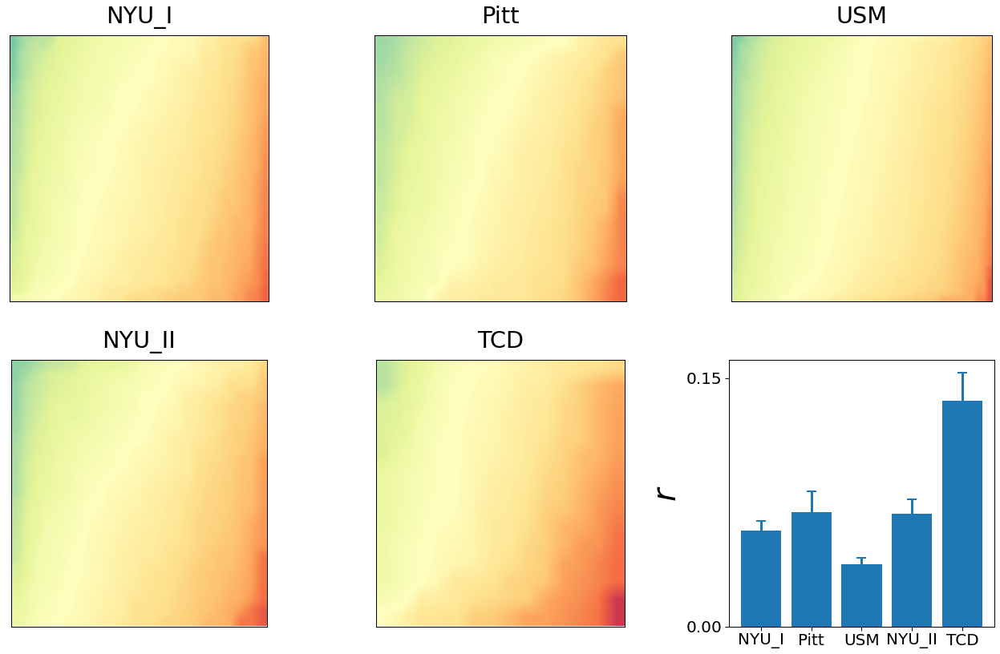

In [52]:
plot_corr_bar(inter_asd_g3, 'indi_asd_corr_inter_g3_site')

separate: [[0.061746510753166096, 0.10817053859627182, 0.07940076182635789, 0.08856286601286772, 0.10514106788950754], [0.003260245466731196, 0.011523517043552792, 0.005168290699085792, 0.013565524159609755, 0.01467522561517037]] total: [0.07458371865462864, 0.0027041062369458986]


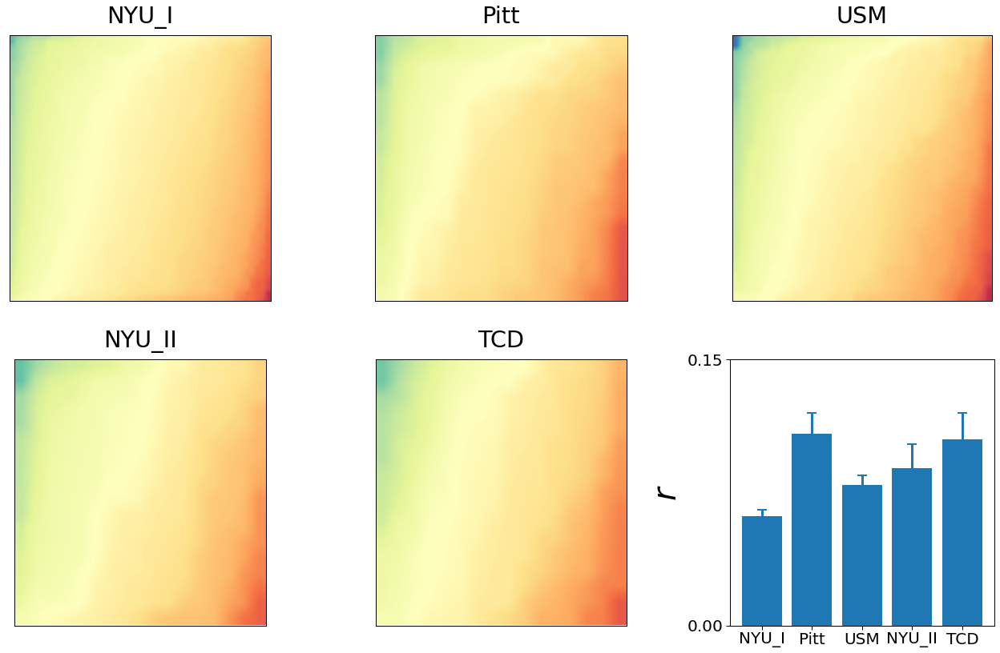

In [53]:
plot_corr_bar(inter_con_g3, 'indi_con_corr_inter_g3_site')

### intra vs inter

In [128]:
compare(intra_con_g1, inter_con_g1, '../results/compare_t_p_con_g1.csv')

every_site: [Ttest_indResult(statistic=0.12409888747576833, pvalue=0.9012467676086616), Ttest_indResult(statistic=-0.027911791337854208, pvalue=0.9777472339156208), Ttest_indResult(statistic=0.7944392199698888, pvalue=0.427081509354331), Ttest_indResult(statistic=0.708847085979488, pvalue=0.4789626004766747), Ttest_indResult(statistic=0.022352548625835668, pvalue=0.9821832416943415)] 
 total: Ttest_indResult(statistic=0.711907956961326, pvalue=0.4765561008748451)


In [129]:
compare(intra_con_g2, inter_con_g2, '../results/compare_t_p_con_g2.csv')

every_site: [Ttest_indResult(statistic=-0.4342786246829736, pvalue=0.6641228950564565), Ttest_indResult(statistic=-0.7376415219773539, pvalue=0.4611899662116963), Ttest_indResult(statistic=-0.4953004409933027, pvalue=0.6204698793198873), Ttest_indResult(statistic=-0.1907988591204348, pvalue=0.8488105394088951), Ttest_indResult(statistic=-0.24399088130365482, pvalue=0.8074231780229661)] 
 total: Ttest_indResult(statistic=-0.9248721764708622, pvalue=0.3550785290276254)


In [130]:
compare(intra_con_g3, inter_con_g3, '../results/compare_t_p_con_g3.csv')

every_site: [Ttest_indResult(statistic=1.5556204287156552, pvalue=0.11992256894309306), Ttest_indResult(statistic=0.37316425719197455, pvalue=0.7092353710363143), Ttest_indResult(statistic=1.3101891474096792, pvalue=0.1903580850745106), Ttest_indResult(statistic=0.33507848316273053, pvalue=0.737796978037743), Ttest_indResult(statistic=-0.49479116134922135, pvalue=0.6211499219585851)] 
 total: Ttest_indResult(statistic=1.736389066191022, pvalue=0.08255872079888317)


In [131]:
compare(intra_asd_g1, inter_asd_g1, '../results/compare_t_p_asd_g1.csv')

every_site: [Ttest_indResult(statistic=0.2492281254793119, pvalue=0.8032274067360552), Ttest_indResult(statistic=0.1688490988361174, pvalue=0.8660157421429581), Ttest_indResult(statistic=1.403522359105618, pvalue=0.16061126493996652), Ttest_indResult(statistic=0.3230791582332194, pvalue=0.7467482323690111), Ttest_indResult(statistic=0.7112430335700171, pvalue=0.4777304875011996)] 
 total: Ttest_indResult(statistic=1.3746274795726983, pvalue=0.16931680702051224)


In [132]:
compare(intra_asd_g2, inter_asd_g2, '../results/compare_t_p_asd_g2.csv')

every_site: [Ttest_indResult(statistic=0.6593140032456065, pvalue=0.5098219300994606), Ttest_indResult(statistic=0.420763122810871, pvalue=0.6741938907853959), Ttest_indResult(statistic=0.4762275316576454, pvalue=0.6339625951095638), Ttest_indResult(statistic=-0.027676282221881333, pvalue=0.977929573903655), Ttest_indResult(statistic=-0.6540895929250339, pvalue=0.5137766070812715)] 
 total: Ttest_indResult(statistic=0.5625126653137862, pvalue=0.5737953687335002)


In [133]:
compare(intra_asd_g3, inter_asd_g3, '../results/compare_t_p_asd_g3.csv')

every_site: [Ttest_indResult(statistic=1.3617862670950436, pvalue=0.17352352146082917), Ttest_indResult(statistic=0.3908053748684849, pvalue=0.6961858630810078), Ttest_indResult(statistic=1.9695701260635974, pvalue=0.049020941623772796), Ttest_indResult(statistic=1.4874348162660893, pvalue=0.1374270857542468), Ttest_indResult(statistic=-0.11152550981820428, pvalue=0.9113071837158904)] 
 total: Ttest_indResult(statistic=2.584090155499103, pvalue=0.00979548759149892)


# Effects of DX group

## load phenotype data

In [54]:
group = np.array(phen['group'])
group[group=='ASD'] = 1.
group[group=='CONTROL'] = 2.
site = np.array(phen['site'])
site[site=='NYU'] = 1.
site[site=='Pitt'] = 2.
site[site=='USM'] = 3.
site[site=='NYU_II'] = 4.
site[site=='TCD'] = 5.
#age = np.array(phen['age'])
#age[age>17.99999] = 1
#age[age>11.99999] = 2
#age[age>5.99999] = 3
phen['group'] = group
phen['site'] = site
#phen['age'] =age
phen['group'] = pd.to_numeric(phen['group'])
phen['site'] = pd.to_numeric(phen['site'])
#phen['age'] = pd.to_numeric(phen['age'])
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,1.0,5.0,15.50,98,2,5,0,0.165400
1,29099,1.0,5.0,10.75,123,3,5,0,0.148400
2,29101,1.0,5.0,14.00,103,3,4,0,0.248200
3,29103,1.0,5.0,14.75,108,4,3,0,0.161700
4,29104,1.0,5.0,19.25,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,1.0,3.0,18.25,106,4,9,1,0.175961
279,32643,1.0,3.0,16.92,84,1,11,0,0.122636
280,32646,1.0,3.0,20.17,108,3,5,0,0.062141
281,32647,1.0,3.0,32.55,126,4,6,0,0.121629


In [55]:
cov = phen[['site', 'age']]
cov

,site,age
0,5.0,15.50
1,5.0,10.75
2,5.0,14.00
3,5.0,14.75
4,5.0,19.25
...,...,...
278,3.0,18.25
279,3.0,16.92
280,3.0,20.17
281,3.0,32.55


In [56]:
group = FixedEffect(phen['group'], 'group')

In [57]:
model = group
model

,intercept,group
0,1,1.0
1,1,1.0
2,1,1.0
3,1,1.0
4,1,1.0
...,...,...
278,1,1.0
279,1,1.0
280,1,1.0
281,1,1.0


## Intra

In [58]:
path = '../results/grad/intra/'
sub = phen['ID']
n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [59]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T
matrix_g1.shape

(283, 180)

In [60]:
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [61]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [62]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [63]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-4.2877230970408675,
 3.7956193359919697,
 -2.7120794265704036,
 2.7556475424299354,
 -2.8340677387807016,
 2.392140514412737,
 0.23311298679514397,
 4.502300477442703)

In [64]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(2.4840983853040147e-05,
 0.00624049941970788,
 0.0049291644845999485,
 4.930043976589747e-06)

In [65]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(), fdr(p_g123).min()

(0.004471377093547227,
 0.4065780279727851,
 0.834348359321373,
 0.0008874079157861545)

In [66]:
a = fdr(p_g123)
boff = 0.05/3
a[a>0.05]=1
p_g1[np.logical_or(p_g1>boff,a==1)]= 1
p_g2[np.logical_or(p_g2>boff,a==1)] = 1
p_g3[np.logical_or(p_g3>boff,a==1)] = 1
np.savetxt('../results/asdVScon_t_p_g1g2g3_pdfr123_intra.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [67]:
t_g1[np.logical_or(p_g1>boff,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>boff,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>boff,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

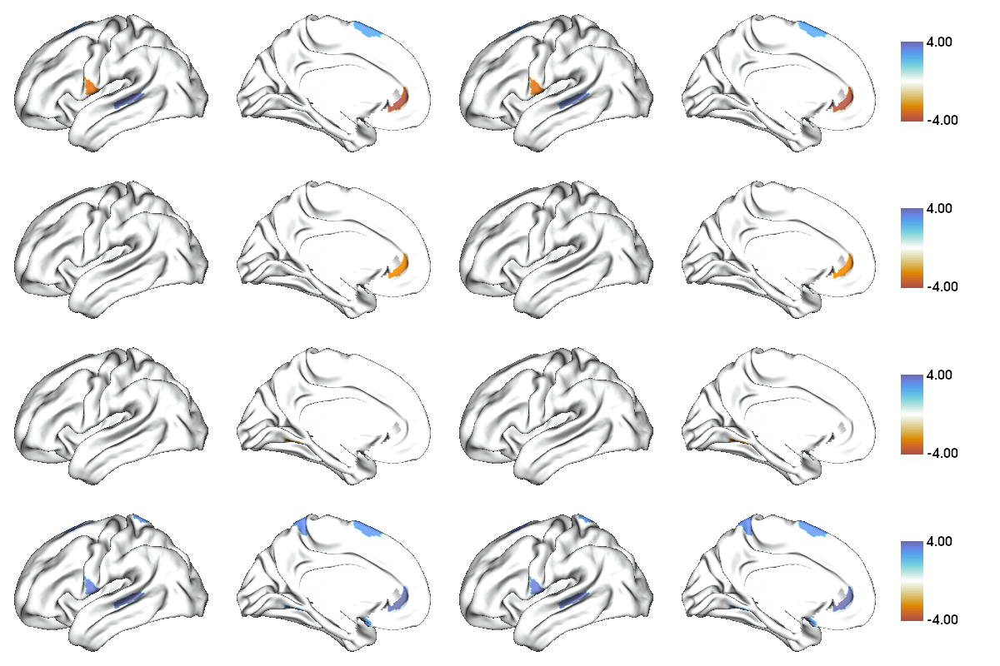

In [68]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/control_asd_t_intra.png')

### network-wise

In [69]:
path = '../results/grad/network/intra/'

n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [70]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [71]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [72]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)  

In [73]:
t_g1, t_g2, t_g3, t_g123

(array([-0.49293002,  0.05742402, -0.36352565, -0.77498027, -0.55438531,
         3.68178527, -0.7112548 , -0.98946562,  0.11710959,  1.42673076,
        -1.57573781, -0.61746428]),
 array([ 0.70099482,  0.51127063, -0.01629276, -0.56685144, -0.8026859 ,
         1.80044016, -1.21138422,  0.16625434, -0.04772156, -0.12081406,
         0.50179699, -0.17043165]),
 array([-1.22174071, -0.33285368,  2.33508723, -0.96429403,  0.94214277,
        -0.68967664,  0.54920355, -0.23438361, -0.58943807, -1.67391714,
         2.03624764, -0.80650384]),
 array([1.27420807, 0.72756123, 2.50098551, 1.19817441, 1.53369879,
        3.73518824, 1.46945859, 1.40295067, 0.59127819, 1.91940571,
        2.33879038, 1.07757848]))

In [74]:
p_g1, p_g2, p_g3, p_g123

(array([6.22447002e-01, 9.54248238e-01, 7.16485596e-01, 4.39002965e-01,
        5.79756119e-01, 2.77675052e-04, 4.77516344e-01, 3.23286615e-01,
        9.06856866e-01, 1.54767661e-01, 1.16211372e-01, 5.37428573e-01]),
 array([0.48388632, 0.60956305, 0.9870124 , 0.57126762, 0.42283467,
        0.07286347, 0.22676592, 0.86807636, 0.96197205, 0.90392465,
        0.61620326, 0.86479333]),
 array([0.22282963, 0.73949293, 0.02024297, 0.33572765, 0.34692881,
        0.49096671, 0.58330193, 0.81485787, 0.55604105, 0.09525956,
        0.04266306, 0.42063444]),
 array([1.01821235e-01, 2.33743991e-01, 6.47711027e-03, 1.15929359e-01,
        6.31144320e-02, 1.13562014e-04, 7.14135593e-02, 8.08677434e-02,
        2.77404686e-01, 2.79727913e-02, 1.00236714e-02, 1.41073052e-01]))

In [75]:
fdr(p_g1), fdr(p_g2),fdr(p_g3), fdr(p_g123)

(array([0.82992934, 0.95424824, 0.85978271, 1.        , 0.86963418,
        0.0033321 , 0.95503269, 0.96985985, 0.9892984 , 0.61907064,
        0.69726823, 0.92130613]),
 array([1.        , 1.        , 0.9870124 , 1.        , 1.        ,
        0.87436162, 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        ]),
 array([0.6684889 , 0.80671956, 0.2429156 , 0.80574636, 0.69385762,
        0.73645007, 0.69996231, 0.81485787, 0.74138807, 0.38103826,
        0.25597838, 0.7210876 ]),
 array([0.15273185, 0.25499344, 0.03886266, 0.15457248, 0.15147464,
        0.00136274, 0.14282712, 0.13863042, 0.27740469, 0.08391837,
        0.04009469, 0.16928766]))

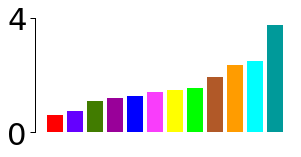

In [76]:
fu.plot_t_single(t_g123, '../figures/ca_intra_multiT.png')

In [77]:
p_g1[p_g1>boff] = 1
p_g2[p_g2>boff] = 1
p_g3[p_g3>boff] = 1
a = fdr(p_g123)
a[a>0.05]=1
np.savetxt('../results/asdVScon_t_p_g1g2g3_pdfr123_intra_ca.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

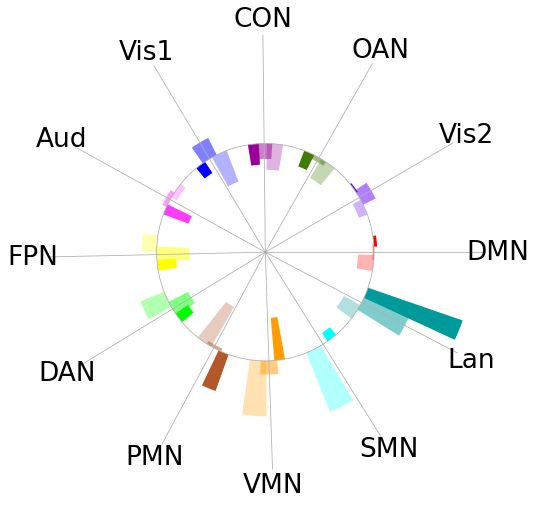

In [78]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_intra_t_g123.png')

## Inter

In [79]:
path = '../results/grad/inter/'
n = len(sub)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [80]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = np.array(matrix).T[2].T
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [81]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [82]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(), t_g3.min(),t_g3.max(), t_g123.min(), t_g123.max()

(-4.389955211114512,
 3.8375244276766343,
 -2.5705897786907865,
 1.9784114351085456,
 -2.900945858209219,
 3.1420712766174232,
 0.48821739419465326,
 4.9783927485827055)

In [83]:
[p_g1.min(), fdr(p_g1).min(), p_g2.min(), fdr(p_g2).min(),
p_g3.min(), fdr(p_g3).min(), p_g123.min(), fdr(p_g123).min()]

[1.606597248014325e-05,
 0.002891875046425785,
 0.01066773263275812,
 0.9162247717609923,
 0.0018568354550430697,
 0.24087225478891416,
 5.600641683414302e-07,
 0.00010081155030145743]

In [84]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[np.logical_or(p_g1>boff,a==1)]  = 1
p_g2[np.logical_or(p_g2>boff,a==1)]  = 1
p_g3[np.logical_or(p_g3>boff,a==1)] = 1
np.savetxt('../results/asdVScon_t_p_g1g2g3_pdfr123_inter.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [85]:
a = fdr(p_g123)
a[a>0.05]=1
t_g1[np.logical_or(p_g1>boff,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>boff,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>boff,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

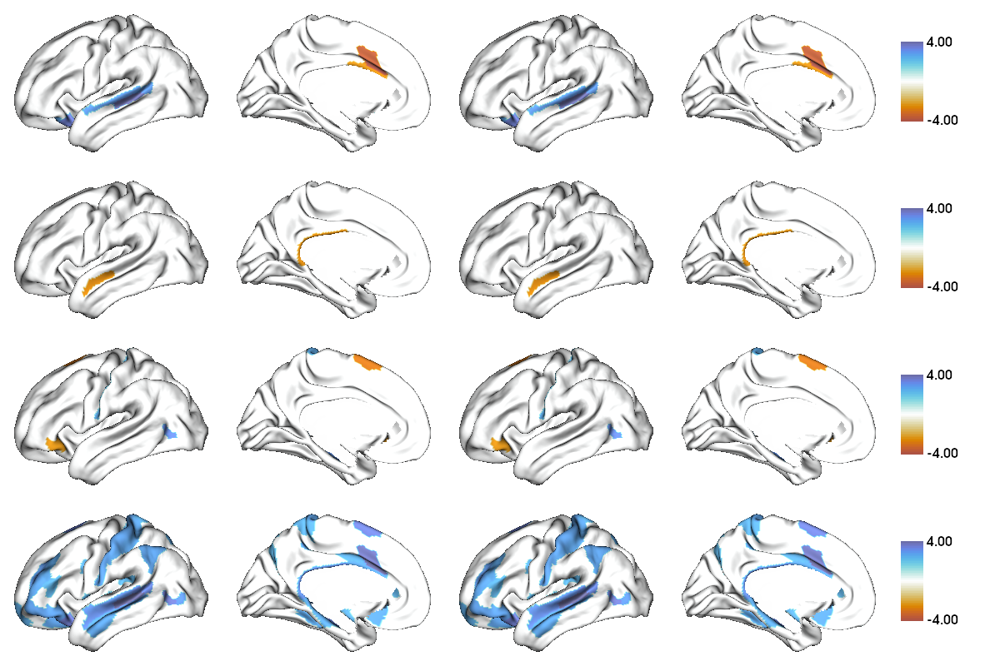

In [86]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/control_asd_t_inter.png')

#### network-wise

In [87]:
path = '../results/grad/network/inter/'
n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [88]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T

In [89]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [90]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof) 

In [91]:
t_g1, t_g2, t_g3, t_g123

(array([-1.06305922, -1.091887  , -0.7907954 , -2.7053357 , -1.15032782,
         3.97298878, -0.32769691, -0.11346586,  1.57471807,  1.06127427,
        -0.99798366, -0.55494694]),
 array([ 0.60882526, -0.11406859,  0.59358602,  1.20818981, -1.16705816,
         0.68207414, -0.59233466,  0.46383203, -1.18130575,  0.0101075 ,
        -0.21825873,  1.32342289]),
 array([-0.33850491,  0.79361203,  3.34712545, -1.2417878 ,  0.96462497,
        -2.24849625, -0.40294569, -0.19165424, -0.08680947, -1.00031402,
         0.72259599, -0.10622554]),
 array([1.09872437, 1.64585529, 3.44271128, 3.09405463, 2.13950989,
        4.48345128, 0.73083562, 0.59080489, 2.18804152, 1.26627346,
        1.17415487, 1.78983231]))

In [92]:
p_g1, p_g2, p_g3, p_g123

(array([2.88667806e-01, 2.75818053e-01, 4.29730305e-01, 7.24042285e-03,
        2.50986872e-01, 9.02686696e-05, 7.43384852e-01, 9.09742254e-01,
        1.16446705e-01, 2.89476555e-01, 3.19145886e-01, 5.79372419e-01]),
 array([0.54313213, 0.90926488, 0.55326653, 0.22799005, 0.24417629,
        0.49575389, 0.55410283, 0.64312719, 0.23848011, 0.99194269,
        0.82738595, 0.18677053]),
 array([7.35235519e-01, 4.28090956e-01, 9.27881351e-04, 2.15350340e-01,
        3.35562100e-01, 2.53195438e-02, 6.87294572e-01, 8.48151464e-01,
        9.30884782e-01, 3.18019174e-01, 4.70529086e-01, 9.15479198e-01]),
 array([1.36414402e-01, 5.04557760e-02, 3.31795717e-04, 1.08668831e-03,
        1.66279422e-02, 5.35449296e-06, 2.32744246e-01, 2.77563021e-01,
        1.47450578e-02, 1.03231951e-01, 1.20663566e-01, 3.72787692e-02]))

In [93]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.57733561, 0.66196333, 0.57297374, 0.04344254, 0.75296062,
        0.00108322, 0.81096529, 0.90974225, 0.46578682, 0.49624552,
        0.47871883, 0.6952469 ]),
 array([1.        , 0.99192532, 0.94845691, 1.        , 0.73252887,
        1.        , 0.83115425, 0.85750292, 0.95392042, 0.99194269,
        0.99286314, 1.        ]),
 array([0.98031403, 0.85618191, 0.01113458, 0.86140136, 0.80534904,
        0.15191726, 1.        , 1.        , 0.93088478, 0.95405752,
        0.80662129, 0.99870458]),
 array([1.63697283e-01, 8.64956161e-02, 1.99077430e-03, 4.34675325e-03,
        3.99070613e-02, 6.42539155e-05, 2.53902813e-01, 2.77563021e-01,
        4.42351733e-02, 1.54847927e-01, 1.60884754e-01, 7.45575383e-02]))

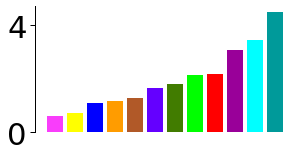

In [94]:
fu.plot_t_single(t_g123, '../figures/ca_inter_multiT.png')

In [95]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[p_g1>boff] = 1
p_g2[p_g2>boff] = 1
p_g3[p_g3>boff] = 1
np.savetxt('../results/asdVScon_t_p_g1g2g3_pdfr123_inter_ca.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

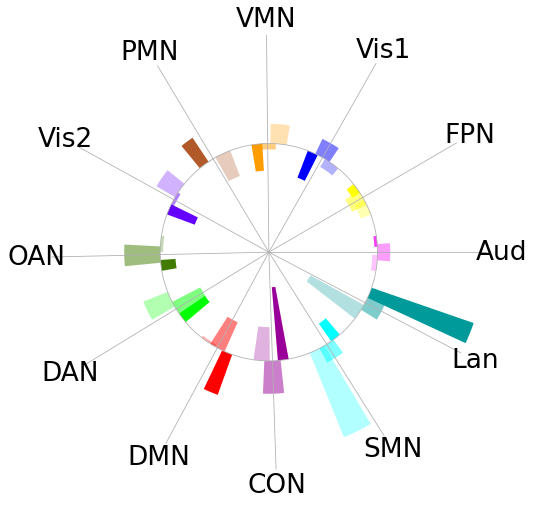

In [96]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_inter_t_g123.png')

## correlation with HCP

In [97]:
data = [np.genfromtxt('../results/con_stat_intra_cohen_pfdr.csv')[:,:3],
        np.genfromtxt('../results/asd_stat_intra_cohen_pfdr.csv')[:,:3],
        np.genfromtxt('../results/con_stat_inter_cohen_pfdr.csv')[:,:3],
        np.genfromtxt('../results/asd_stat_inter_cohen_pfdr.csv')[:,:3]]

In [98]:
[ss.pearsonr(data[0][:,0], hcp_cohen[0]),
 ss.pearsonr(data[0][:,1], hcp_cohen[1]),
 ss.pearsonr(data[0][:,2], hcp_cohen[2]),
 ss.pearsonr(data[1][:,0], hcp_cohen[0]),
 ss.pearsonr(data[1][:,1], hcp_cohen[1]),
 ss.pearsonr(data[1][:,2], hcp_cohen[2]),
 ss.pearsonr(data[2][:,0], hcp_cohen[3]),
 ss.pearsonr(data[2][:,1], hcp_cohen[4]),
 ss.pearsonr(data[2][:,2], hcp_cohen[5]),
 ss.pearsonr(data[3][:,0], hcp_cohen[3]),
 ss.pearsonr(data[3][:,1], hcp_cohen[4]),
 ss.pearsonr(data[3][:,2], hcp_cohen[5])]

[(0.6978510367331543, 1.350806414311884e-27),
 (0.4936667256191058, 1.900724289248832e-12),
 (0.7531032468073023, 3.3898371693162547e-34),
 (0.599082549428886, 6.46881097616092e-19),
 (0.4671309079688557, 3.8316180728095305e-11),
 (0.6526602275105992, 3.1895514588118527e-23),
 (0.5166133215633724, 1.1393293747488808e-13),
 (0.4067643682064618, 1.4597466881770463e-08),
 (0.7150522957573778, 1.7550552016249506e-29),
 (0.5123728591457228, 1.9474204825941454e-13),
 (0.3926180971402642, 4.9996547980703705e-08),
 (0.6116848461983517, 7.429889558795974e-20)]

In [99]:
spin_con_asd_intra_g1 = fu.spin_pearson_pair(hcp_cohen[0], data[0][:,0], data[1][:,0])
spin_con_asd_intra_g2 = fu.spin_pearson_pair(hcp_cohen[1], data[0][:,1], data[1][:,1])
spin_con_asd_intra_g3 = fu.spin_pearson_pair(hcp_cohen[2], data[0][:,2], data[1][:,2])
spin_con_asd_inter_g1 = fu.spin_pearson_pair(hcp_cohen[3], data[2][:,0], data[3][:,0])
spin_con_asd_inter_g2 = fu.spin_pearson_pair(hcp_cohen[4], data[2][:,1], data[3][:,1])
spin_con_asd_inter_g3 = fu.spin_pearson_pair(hcp_cohen[5], data[2][:,2], data[3][:,2])
[spin_con_asd_intra_g1.spin_p1, spin_con_asd_intra_g1.spin_p2,
 spin_con_asd_intra_g2.spin_p1, spin_con_asd_intra_g2.spin_p2,
 spin_con_asd_intra_g3.spin_p1, spin_con_asd_intra_g3.spin_p2,
 spin_con_asd_inter_g1.spin_p1, spin_con_asd_inter_g1.spin_p2,
 spin_con_asd_inter_g2.spin_p1, spin_con_asd_inter_g2.spin_p2,
 spin_con_asd_inter_g3.spin_p1, spin_con_asd_inter_g3.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005, 0.002, 0.0, 0.0]

In [100]:
res = fu.res
[res(hcp_cohen[0], data[0][:,0]),
 res(hcp_cohen[1], data[0][:,1]),
 res(hcp_cohen[2], data[0][:,2]),
 res(hcp_cohen[0], data[1][:,0]),
 res(hcp_cohen[1], data[1][:,1]),
 res(hcp_cohen[2], data[1][:,2]),
 res(hcp_cohen[3], data[2][:,0]),
 res(hcp_cohen[4], data[2][:,1]),
 res(hcp_cohen[5], data[2][:,2]),
 res(hcp_cohen[3], data[3][:,0]),
 res(hcp_cohen[4], data[3][:,1]),
 res(hcp_cohen[5], data[3][:,2])]

[BootstrapResult(confidence_interval=ConfidenceInterval(low=0.6051475744492695, high=0.7754601544092724), standard_error=0.04324902215058348),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.35603559220516134, high=0.6114283488148794), standard_error=0.06510487237743295),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.6862773076370043, high=0.805869152116143), standard_error=0.030246045464384506),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.47373670247251115, high=0.6999991708916283), standard_error=0.05814043167209661),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.34456009805972665, high=0.5765514145771624), standard_error=0.058887942542136626),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.56387030862196, high=0.7271238023675466), standard_error=0.0415513937216718),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.4029655318964785, high=0.6275338583414662), standard_error=0.057413570704771204

# AGE effects

## phen

In [101]:
phen['age'][phen['age']>18] = 3
phen['age'][phen['age']>12] = 2
phen['age'][phen['age']>4] = 1
phen['group'][phen['group']==2]=-1
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,1.0,5.0,2.0,98,2,5,0,0.165400
1,29099,1.0,5.0,1.0,123,3,5,0,0.148400
2,29101,1.0,5.0,2.0,103,3,4,0,0.248200
3,29103,1.0,5.0,2.0,108,4,3,0,0.161700
4,29104,1.0,5.0,3.0,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,1.0,3.0,3.0,106,4,9,1,0.175961
279,32643,1.0,3.0,2.0,84,1,11,0,0.122636
280,32646,1.0,3.0,3.0,108,3,5,0,0.062141
281,32647,1.0,3.0,3.0,126,4,6,0,0.121629


In [102]:
# control_adult,adol,kid and asd_adult,adol,kid
age_dx = [np.array(phen[phen['group']==-1][phen['age']==3].index),
          np.array(phen[phen['group']==-1][phen['age']==2].index),
          np.array(phen[phen['group']==-1][phen['age']==1].index),
          np.array(phen[phen['group']==1][phen['age']==3].index),
          np.array(phen[phen['group']==1][phen['age']==2].index),
          np.array(phen[phen['group']==1][phen['age']==1].index)]
[len(age_dx[i]) for i in range(6)]

[65, 46, 32, 60, 43, 37]

In [103]:
def harmony(data):
    data_combat = neuroCombat(dat=data.T, mean_only= True,
                              covars=cov,
                              batch_col='site')['data']
    return data_combat.T

In [104]:
cov = pd.DataFrame(phen['site'])
cov

,site
0,5.0
1,5.0
2,5.0
3,5.0
4,5.0
...,...
278,3.0
279,3.0
280,3.0
281,3.0


In [105]:
group = FixedEffect(phen['group'], 'group')
age = FixedEffect(phen['age'], 'age')
interact = FixedEffect(phen['group']*phen['age'], 'interact')
model = group + age + interact
model

,intercept,group,age,interact
0,1,1.0,2.0,2.0
1,1,1.0,1.0,1.0
2,1,1.0,2.0,2.0
3,1,1.0,2.0,2.0
4,1,1.0,3.0,3.0
...,...,...,...,...
278,1,1.0,3.0,3.0
279,1,1.0,2.0,2.0
280,1,1.0,3.0,3.0
281,1,1.0,3.0,3.0


## intra

### stats

In [106]:
path = '../results/grad/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

matrix = np.array(matrix).T
matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [107]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T)

In [108]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [109]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-2.4836944387238895,
 2.8635873539122887,
 -3.3203561621650044,
 4.282243478735756,
 -2.7591139344481657,
 2.6457611047703167,
 0.10833387873526397,
 4.359939869739555)

In [110]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(0.004506621760872626,
 2.547784718397553e-05,
 0.006179210208089278,
 9.158459296370662e-06)

In [111]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(),fdr(p_g123).min()

(0.8111919169570727,
 0.004586012493115596,
 0.3679701483694567,
 0.0016485226733467192)

In [112]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[np.logical_or(p_g1>boff,a==1)]= 1
p_g2[np.logical_or(p_g2>boff,a==1)] = 1
p_g3[np.logical_or(p_g3>boff,a==1)] = 1
np.savetxt('../results/interact_t_p_g1g2g3_pdfr123_intra.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [113]:
t_g1[np.logical_or(p_g1>boff,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>boff,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>boff,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

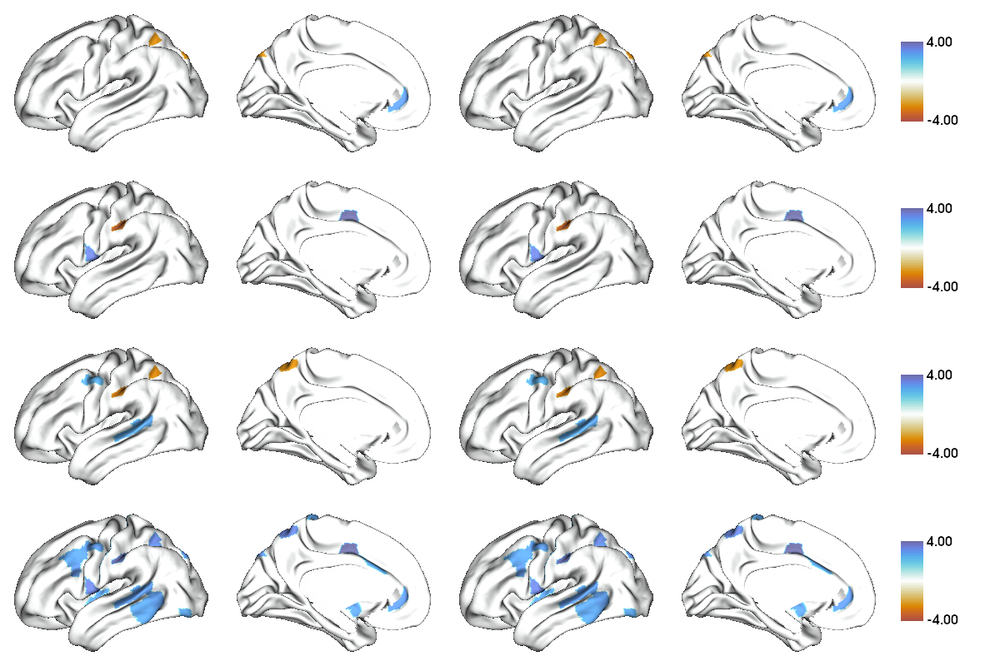

In [114]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/interact_t_intra.png')

In [115]:
mean = np.zeros((6,180,3))
sd = np.zeros((6,180,3))
ste = np.zeros((6,180,3))
for j in range(6):
  for i in range(180):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])

In [116]:
def t_pfdr(num_1, num_2, node, ga, filename): # ga: 'group' or 'age'
  contrast = phen[ga][np.concatenate((age_dx[num_1], age_dx[num_2]))]
  model = FixedEffect(phen[ga][np.concatenate((age_dx[num_1], age_dx[num_2]))], ga)
  slm_g1 = SLM(model, contrast=contrast)
  slm_g1.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[0].T)
  slm_g2 = SLM(model, contrast=contrast)
  slm_g2.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[1].T)
  slm_g3 = SLM(model, contrast=contrast)
  slm_g3.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[2].T)
  slm_g123 = SLM(model, contrast=contrast)
  slm_g123.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))])
  t_g1 = slm_g1.t[0]
  t_g2 = slm_g2.t[0]
  t_g3 = slm_g3.t[0]
  p_g1 = np.zeros(node)
  p_g2 = np.zeros(node)
  p_g3 = np.zeros(node)
  t_g123 = slm_g123.t[0]
  p_g123 = np.zeros(node)
  dof = model.shape[0] - model.shape[1] # degree of freedom
  for i in range(node):
    # p-value for one-sided test two-side = *2, multivariates just one side
    p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
    p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
    p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
    p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

  p_g1[p_g1>boff] = 1
  p_g2[p_g2>boff] = 1
  p_g3[p_g3>boff] = 1
  a = fdr(p_g123)
  a[a>0.05]=1
  np.savetxt('../results/'+filename+'_t_p_g1g2g3_pdfr123.csv', 
             np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)
  return print('Finish saving ' + filename)

In [117]:
t_pfdr(0, 3, 180, 'group', 'intra_adult_con_asd')
t_pfdr(1, 4, 180, 'group', 'intra_adol_con_asd')
t_pfdr(2, 5, 180, 'group', 'intra_kid_con_asd')
t_pfdr(0, 1, 180, 'age', 'intra_con_adult_adol')
t_pfdr(0, 2, 180, 'age', 'intra_con_adult_kid')
t_pfdr(1, 2, 180, 'age', 'intra_con_adol_kid')
t_pfdr(3, 4, 180, 'age', 'intra_asd_adult_adol')
t_pfdr(3, 5, 180, 'age', 'intra_asd_adult_kid')
t_pfdr(4, 5, 180, 'age', 'intra_asd_adol_kid')

Finish saving intra_adult_con_asd
Finish saving intra_adol_con_asd
Finish saving intra_kid_con_asd
Finish saving intra_con_adult_adol
Finish saving intra_con_adult_kid
Finish saving intra_con_adol_kid
Finish saving intra_asd_adult_adol
Finish saving intra_asd_adult_kid
Finish saving intra_asd_adol_kid


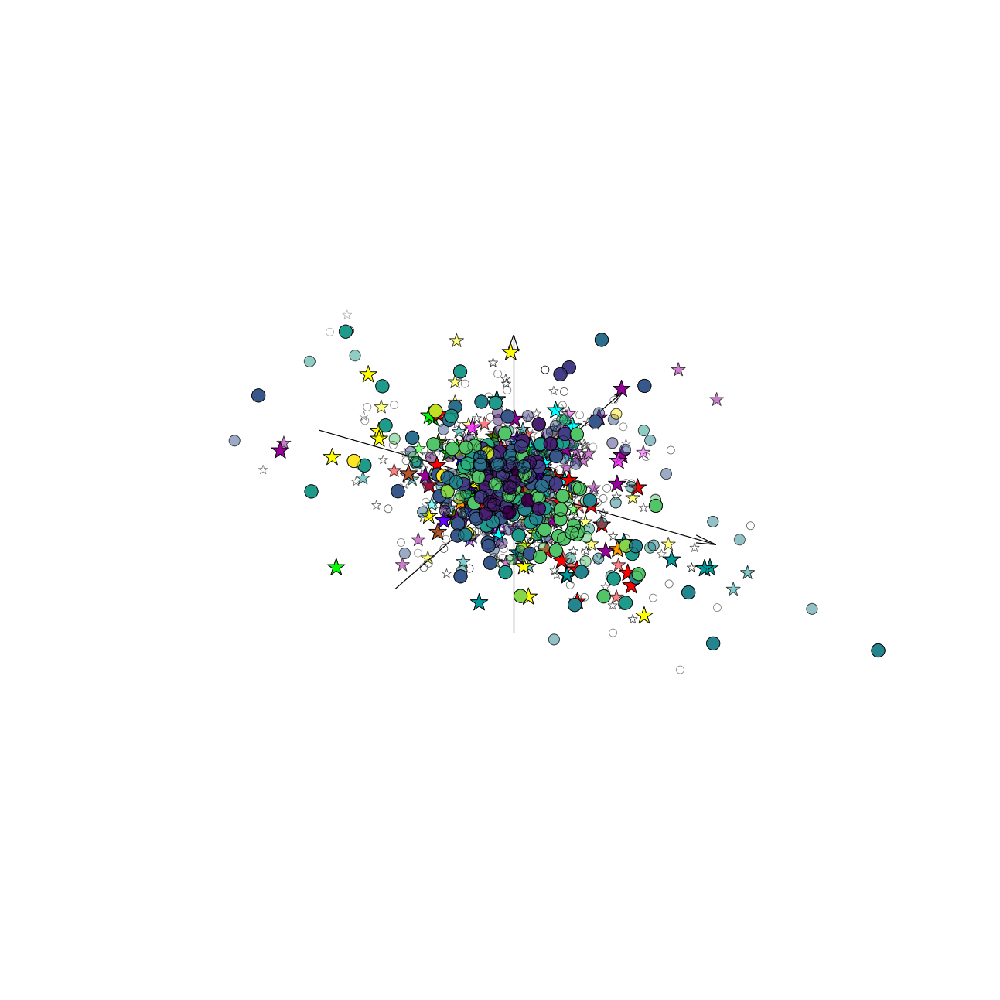

In [118]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.04, 0.04)
ax.set_ylim(-0.04, 0.04)
ax.set_zlim(-0.04, 0.04)
ax.set_xticks(np.arange(-0.04,0.04,0.02))
ax.set_yticks(np.arange(-0.04,0.04,0.02))
ax.set_zticks(np.arange(-0.04,0.04,0.02))
ax._axis3don = False
x, y, z = np.array([[-0.03,0,0],[0,-0.03,0],[0,0,-0.03]])
u, v, w = np.array([[0.06,0,0],[0,0.06,0],[0,0,0.06]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = color, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = color, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = [0,0,0,0], cmap=cmap, marker = '*')
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/age_dx_mean_intra_3d.png', dpi=300, transparent=True)

### parcel-wise

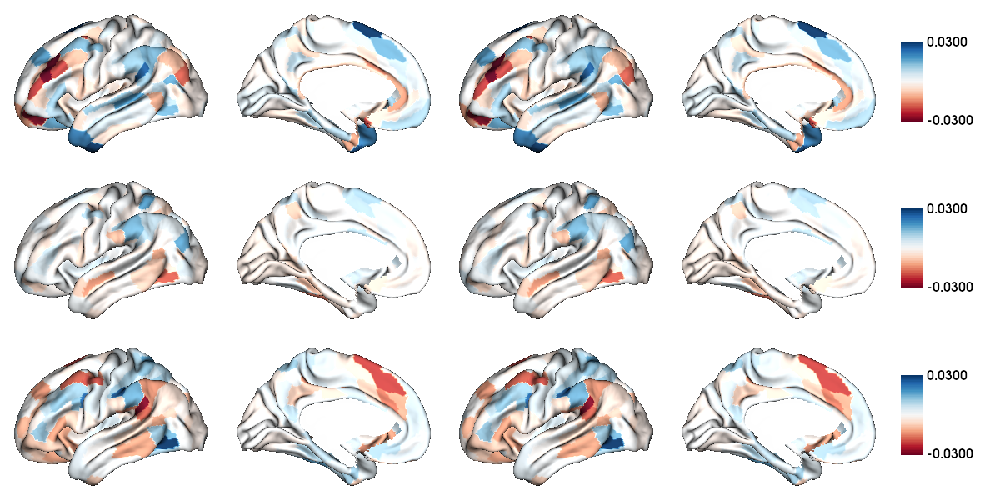

In [119]:
fu.plot_mean_save_sd(mean, sd, 0, 'control_adult_intra')

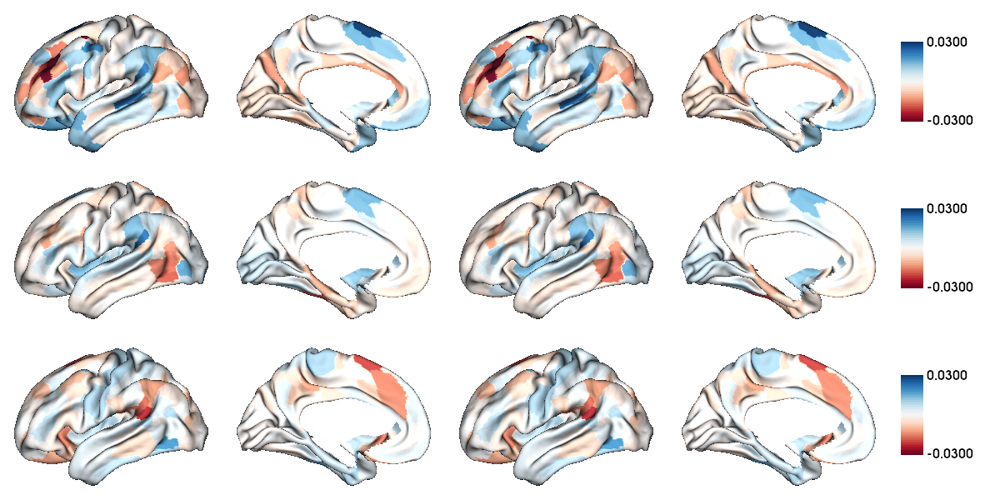

In [120]:
fu.plot_mean_save_sd(mean, sd, 1, 'control_adol_intra')

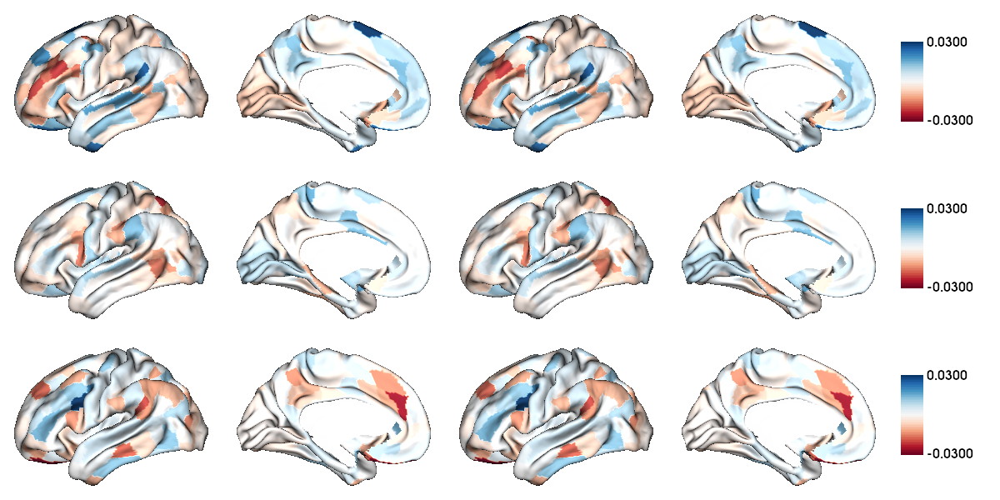

In [121]:
fu.plot_mean_save_sd(mean, sd, 2, 'control_kid_intra')

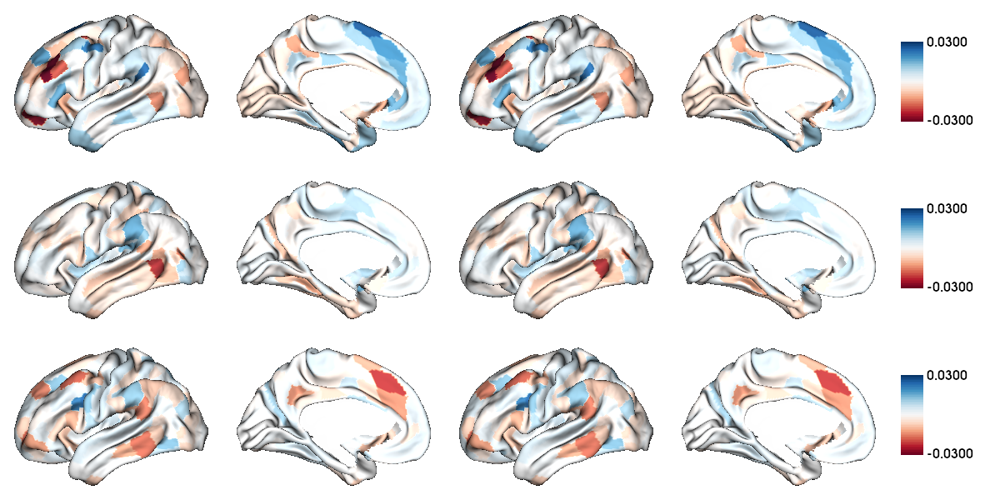

In [122]:
fu.plot_mean_save_sd(mean, sd, 3, 'asd_adult_intra')

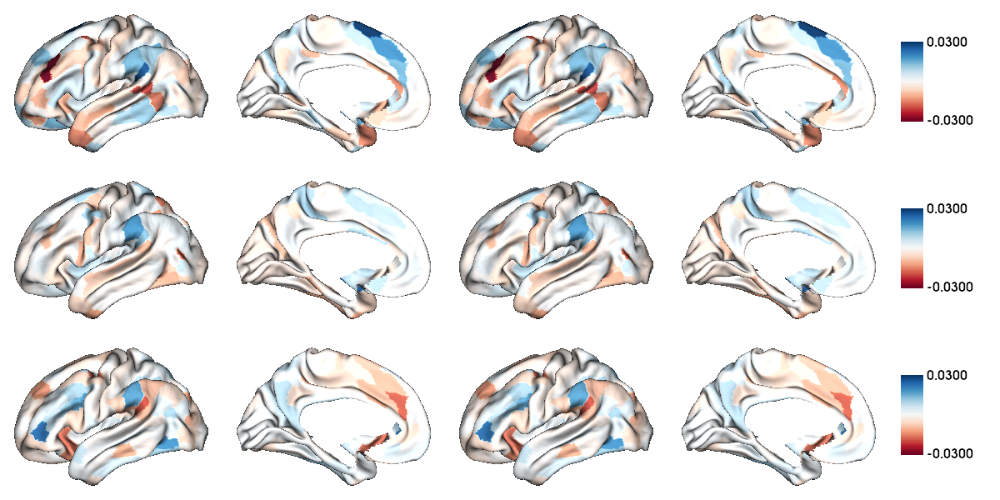

In [123]:
fu.plot_mean_save_sd(mean, sd, 4, 'asd_adol_intra')

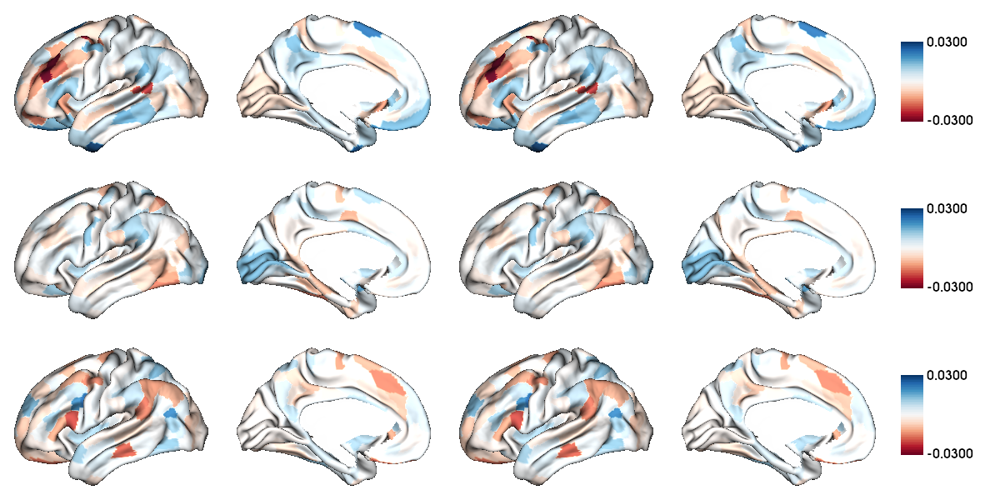

In [124]:
fu.plot_mean_save_sd(mean, sd, 5, 'asd_kid_intra')

### Correlations

In [125]:
data = [np.genfromtxt('../results/mean_control_adult_intra.csv'),
        np.genfromtxt('../results/mean_control_adol_intra.csv'),
        np.genfromtxt('../results/mean_control_kid_intra.csv'),
        np.genfromtxt('../results/mean_asd_adult_intra.csv'),
        np.genfromtxt('../results/mean_asd_adol_intra.csv'),
        np.genfromtxt('../results/mean_asd_kid_intra.csv')]

In [126]:
hcp_intra = np.loadtxt('../../evolution/results/gradient/mean_asym_LLRR.csv', delimiter=',')
[ss.pearsonr(hcp_intra[:,0], data[0][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[0][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[0][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[1][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[1][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[1][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[2][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[2][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[2][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[3][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[3][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[3][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[4][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[4][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[4][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[5][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[5][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[5][:,2])]

[(0.638185820932361, 5.639848239660881e-22),
 (0.4032876034872607, 1.986112538608139e-08),
 (0.7235845146622678, 1.8030713537377074e-30),
 (0.647031279813933, 9.928735062872712e-23),
 (0.36231470695466683, 5.79390036832871e-07),
 (0.6065880026992845, 1.8034899627837224e-19),
 (0.5560277753467653, 5.370297350038441e-16),
 (0.37468211922555733, 2.196524087352001e-07),
 (0.47645722786327144, 1.3728827900741641e-11),
 (0.6215826828356181, 1.2672672001143401e-20),
 (0.2970132902316164, 5.147218744671645e-05),
 (0.5704348684123167, 6.315437644515853e-17),
 (0.3698678524544551, 3.219608480301918e-07),
 (0.387365647478545, 7.78347111466143e-08),
 (0.5370905412819238, 7.686175109981063e-15),
 (0.5645333548286576, 1.536919021841123e-16),
 (0.3527513507030234, 1.1934344246941823e-06),
 (0.5819595533518421, 1.0554881303415851e-17)]

In [127]:
# g1
spin_con_asd_intra_adult = fu.spin_pearson_pair(hcp_intra[:,0], data[0][:,0], data[3][:,0])
spin_con_asd_intra_adol = fu.spin_pearson_pair(hcp_intra[:,0], data[1][:,0], data[4][:,0])
spin_con_asd_intra_kid = fu.spin_pearson_pair(hcp_intra[:,0], data[2][:,0], data[5][:,0])
[spin_con_asd_intra_adult.spin_p1, spin_con_asd_intra_adult.spin_p2,
 spin_con_asd_intra_adol.spin_p1, spin_con_asd_intra_adol.spin_p2,
 spin_con_asd_intra_kid.spin_p1, spin_con_asd_intra_kid.spin_p2]

KeyboardInterrupt: 

In [ ]:
# g2
spin_con_asd_intra_adult = fu.spin_pearson_pair(hcp_intra[:,1], data[0][:,1], data[3][:,1])
spin_con_asd_intra_adol = fu.spin_pearson_pair(hcp_intra[:,1], data[1][:,1], data[4][:,1])
spin_con_asd_intra_kid = fu.spin_pearson_pair(hcp_intra[:,1], data[2][:,1], data[5][:,1])
[spin_con_asd_intra_adult.spin_p1, spin_con_asd_intra_adult.spin_p2,
 spin_con_asd_intra_adol.spin_p1, spin_con_asd_intra_adol.spin_p2,
 spin_con_asd_intra_kid.spin_p1, spin_con_asd_intra_kid.spin_p2]

[0.0, 0.004, 0.0, 0.0, 0.0, 0.0]

In [ ]:
# g3
spin_con_asd_intra_adult = fu.spin_pearson_pair(hcp_intra[:,2], data[0][:,2], data[3][:,2])
spin_con_asd_intra_adol = fu.spin_pearson_pair(hcp_intra[:,2], data[1][:,2], data[4][:,2])
spin_con_asd_intra_kid = fu.spin_pearson_pair(hcp_intra[:,2], data[2][:,2], data[5][:,2])
[spin_con_asd_intra_adult.spin_p1, spin_con_asd_intra_adult.spin_p2,
 spin_con_asd_intra_adol.spin_p1, spin_con_asd_intra_adol.spin_p2,
 spin_con_asd_intra_kid.spin_p1, spin_con_asd_intra_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [ ]:
res = fu.res
[res(hcp_intra[:,0], data[0][:,0]),
 res(hcp_intra[:,1], data[0][:,1]),
 res(hcp_intra[:,2], data[0][:,2]),
 res(hcp_intra[:,0], data[1][:,0]),
 res(hcp_intra[:,1], data[1][:,1]),
 res(hcp_intra[:,2], data[1][:,2]),
 res(hcp_intra[:,0], data[2][:,0]),
 res(hcp_intra[:,1], data[2][:,1]),
 res(hcp_intra[:,2], data[2][:,2]),
 res(hcp_intra[:,0], data[3][:,0]),
 res(hcp_intra[:,1], data[3][:,1]),
 res(hcp_intra[:,2], data[3][:,2]),
 res(hcp_intra[:,0], data[4][:,0]),
 res(hcp_intra[:,1], data[4][:,1]),
 res(hcp_intra[:,2], data[4][:,2]),
 res(hcp_intra[:,0], data[5][:,0]),
 res(hcp_intra[:,1], data[5][:,1]),
 res(hcp_intra[:,2], data[5][:,2])]

[BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5159489543657698, high=0.7383522501506536), standard_error=0.05782815067886244),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.19782367336887272, high=0.5661280305425319), standard_error=0.09457831668823165),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.6322295354682194, high=0.7845058933023563), standard_error=0.03761331218804406),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.541373717397509, high=0.7381028549178649), standard_error=0.05008927422523615),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.1560497355543836, high=0.5318940130850801), standard_error=0.09638722744093046),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5019934710070638, high=0.6842274760335558), standard_error=0.045685417609249844),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.3991686903257121, high=0.6746475211119841), standard_error=0.06983590849233687)

### network-wise

In [ ]:
path = '../results/grad/network/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [ ]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(matrix_total)

In [ ]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [ ]:
t_g1, t_g2, t_g3, t_g123

(array([-2.12361118, -1.03195636, -0.24400938,  1.27428151, -0.02823723,
        -0.02344235, -0.00706063,  1.59595915, -0.23567393, -1.81261085,
         1.48279383,  0.34710035]),
 array([ 0.30819228,  0.09690337,  0.72622161,  1.86156074, -2.3456468 ,
        -0.2174821 , -1.86953376,  1.14028158, -0.41142234, -1.17167848,
         0.20884269,  0.7095787 ]),
 array([ 0.58800983, -2.06662131,  0.8441323 ,  0.0211402 , -0.9935436 ,
         3.82956217,  0.83804363,  1.09219143, -0.74596969,  0.30910545,
        -1.88859856,  0.03082844]),
 array([2.40801548, 2.35217057, 1.22820625, 1.99341287, 2.90548361,
        3.90686807, 2.10576117, 1.81671717, 0.86221547, 2.3602696 ,
        2.20472806, 0.71064026]))

In [ ]:
p_g1, p_g2, p_g3, p_g123

(array([0.03458261, 0.30298627, 0.80740289, 0.20362403, 0.97749313,
        0.98131418, 0.99437152, 0.11162996, 0.8138586 , 0.07096661,
        0.13925786, 0.72877761]),
 array([0.75816599, 0.9228727 , 0.46831172, 0.06371651, 0.01969453,
        0.82799162, 0.06259597, 0.25514692, 0.68107874, 0.24232577,
        0.83472343, 0.47855801]),
 array([5.57001344e-01, 3.96924152e-02, 3.99318683e-01, 9.83148930e-01,
        3.21306006e-01, 1.58569749e-04, 4.02723560e-01, 2.75691181e-01,
        4.56313768e-01, 7.57472014e-01, 5.99828628e-02, 9.75428402e-01]),
 array([8.34422289e-03, 9.67962529e-03, 1.10202319e-01, 2.35949276e-02,
        1.98030567e-03, 5.86926060e-05, 1.80593136e-02, 3.51666787e-02,
        1.94654719e-01, 9.47499699e-03, 1.41446339e-02, 2.38950402e-01]))

In [ ]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.41499133, 0.60597255, 1.        , 0.48869767, 1.        ,
        1.        , 0.99437152, 0.44651984, 1.        , 0.42579966,
        0.41777359, 1.        ]),
 array([1.        , 0.9228727 , 0.93662344, 0.25486605, 0.2363344 ,
        0.99358994, 0.37557581, 0.61235262, 1.        , 0.7269773 ,
        0.91060738, 0.82038516]),
 array([0.74266846, 0.23815449, 0.79863737, 0.98314893, 0.77113441,
        0.00190284, 0.69038325, 0.82707354, 0.68447065, 0.90896642,
        0.23993145, 1.        ]),
 array([0.03337689, 0.0232311 , 0.13224278, 0.03539239, 0.01188183,
        0.00070431, 0.03095882, 0.0468889 , 0.2123506 , 0.02842499,
        0.02828927, 0.2389504 ]))

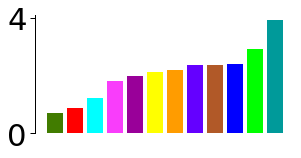

In [ ]:
fu.plot_t_single(t_g123, '../figures/ca_interact_intra_multiT.png')

In [ ]:
mean = np.zeros((6,12,3))
sd = np.zeros((6,12,3))
ste = np.zeros((6,12,3))
name = ['control_adult', 'control_adol', 'control_kid', 'asd_adult', 'asd_adol', 'asd_kid']
for j in range(6):
  for i in range(12):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])
  np.savetxt('../results/intra_mean_ca_'+name[j]+'.csv', mean[j])
  np.savetxt('../results/intra_sd_ca_'+name[j]+'.csv', sd[j])

In [ ]:
t_pfdr(0, 3, 12, 'group', 'ca_intra_adult_con_asd')
t_pfdr(1, 4, 12, 'group', 'ca_intra_adol_con_asd')
t_pfdr(2, 5, 12, 'group', 'ca_intra_kid_con_asd')
t_pfdr(0, 1, 12, 'age', 'ca_intra_con_adult_adol')
t_pfdr(0, 2, 12, 'age', 'ca_intra_con_adult_kid')
t_pfdr(1, 2, 12, 'age', 'ca_intra_con_adol_kid')
t_pfdr(3, 4, 12, 'age', 'ca_intra_asd_adult_adol')
t_pfdr(3, 5, 12, 'age', 'ca_intra_asd_adult_kid')
t_pfdr(4, 5, 12, 'age', 'ca_intra_asd_adol_kid')

Finish saving ca_intra_adult_con_asd
Finish saving ca_intra_adol_con_asd
Finish saving ca_intra_kid_con_asd
Finish saving ca_intra_con_adult_adol
Finish saving ca_intra_con_adult_kid
Finish saving ca_intra_con_adol_kid
Finish saving ca_intra_asd_adult_adol
Finish saving ca_intra_asd_adult_kid
Finish saving ca_intra_asd_adol_kid


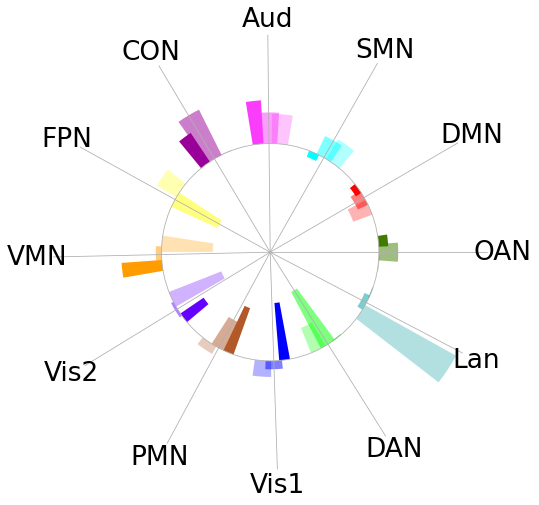

In [ ]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_interact_intra_t_g123.png')

In [ ]:
[np.where(np.logical_and(p_g1<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g2<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g3<0.05, fdr(p_g123)<0.05))[0]]

[array([0]), array([4]), array([1, 5])]

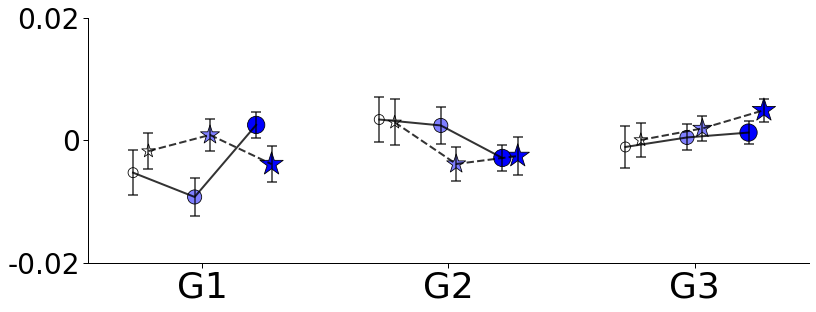

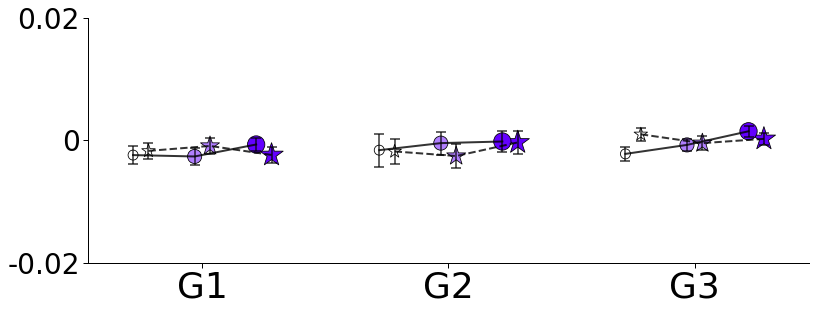

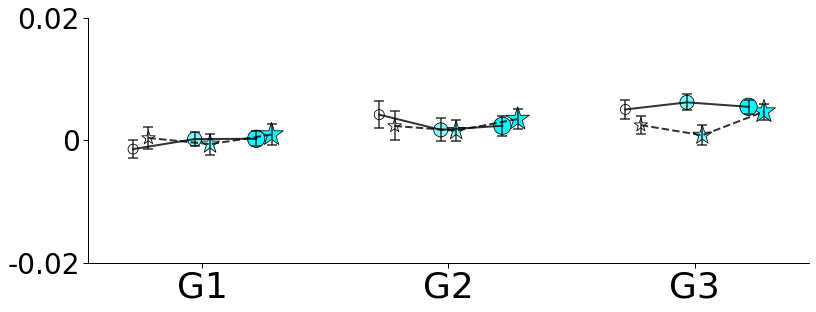

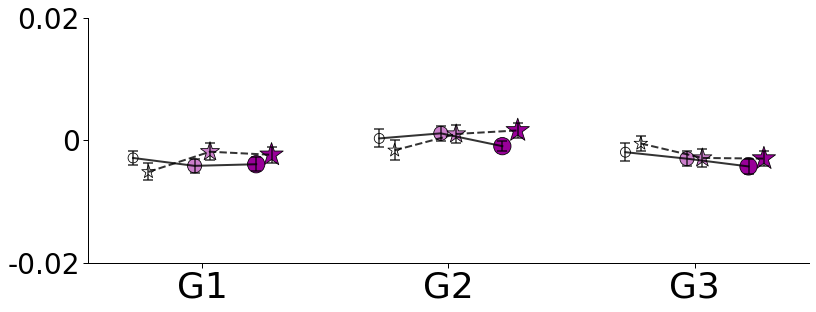

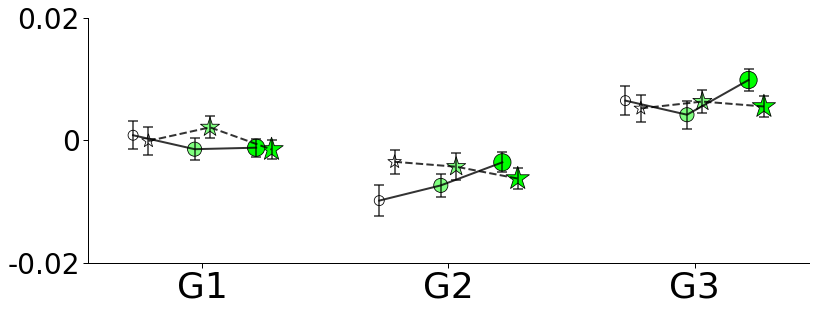

...

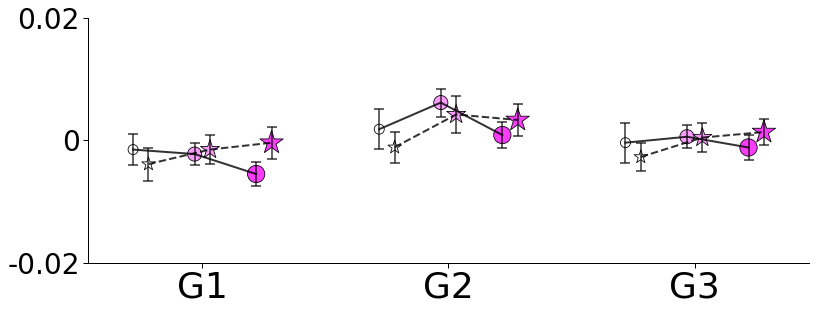

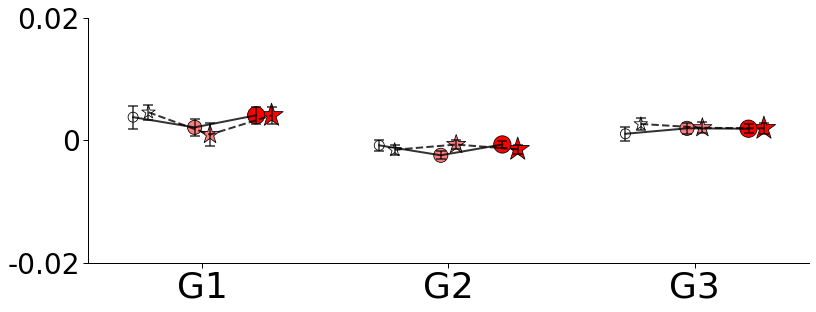

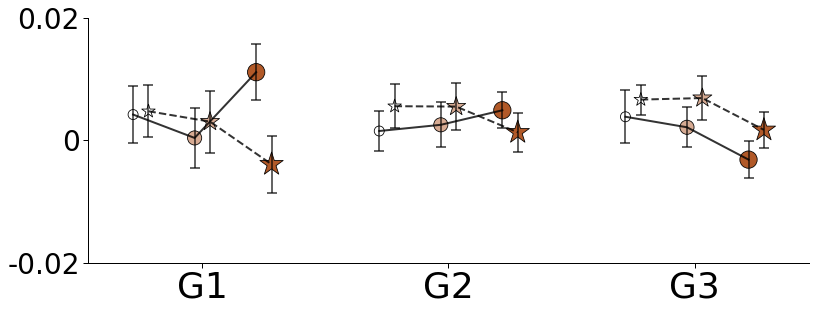

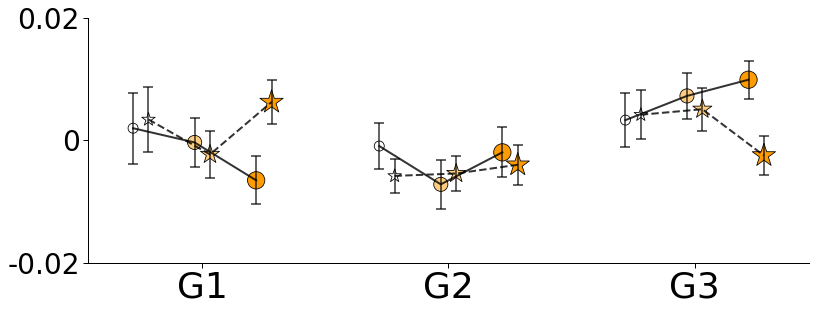

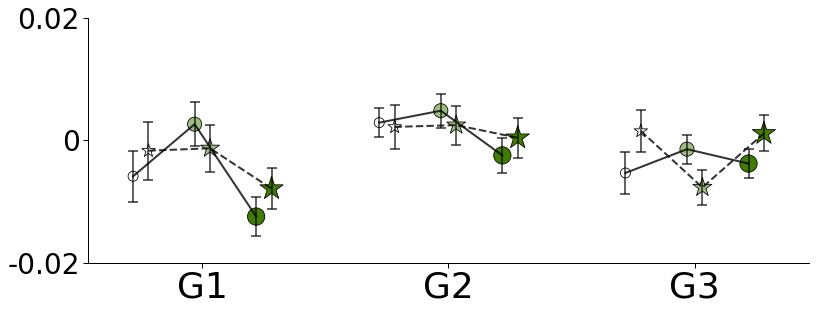

In [ ]:
for i in range (12):
  fu.plot_interact(mean, ste, i, 'intra')

In [ ]:
mean[:3][:,5][:,0], mean[:3][:,5][:,1], mean[:3][:,5][:,2]

(array([0.01180952, 0.01370211, 0.0087349 ]),
 array([-0.0007975 ,  0.00114597,  0.00028124]),
 array([-0.00235733,  0.00133709,  0.00740996]))

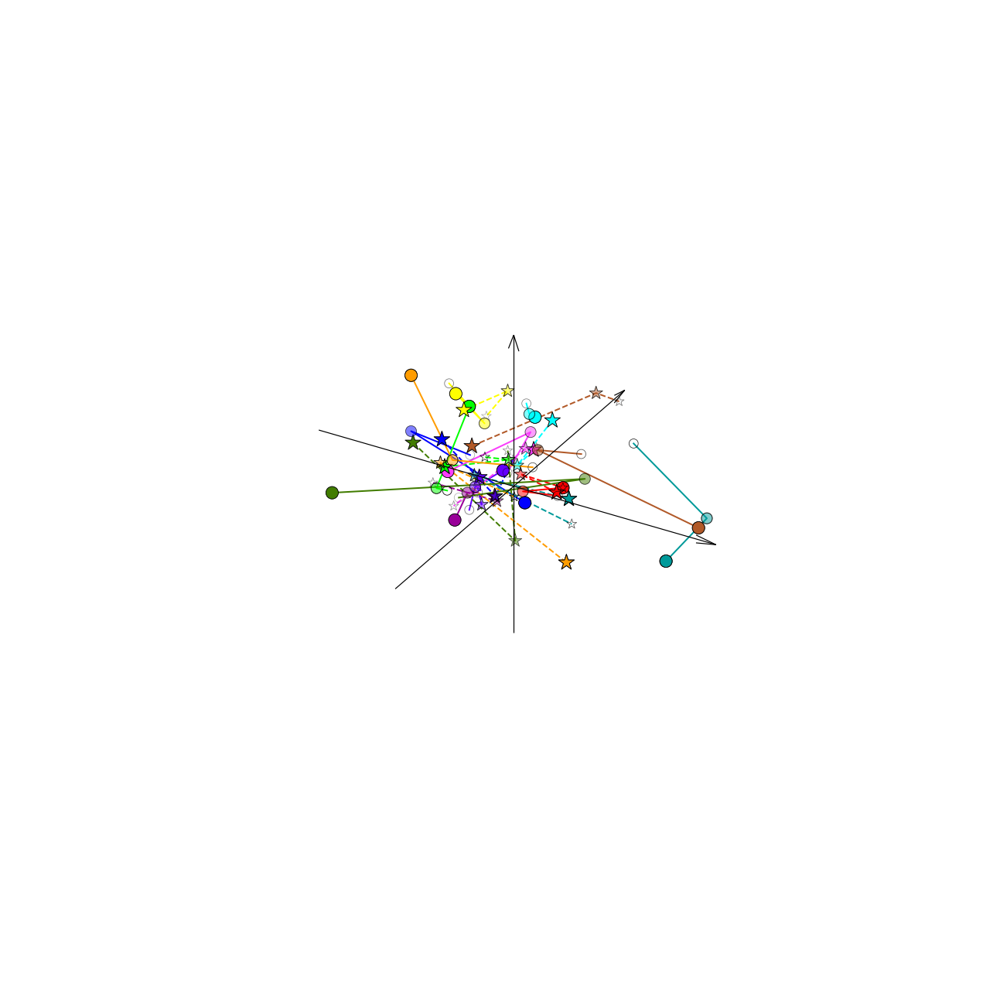

In [ ]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.02, 0.02)
ax.set_ylim(-0.02, 0.02)
ax.set_zlim(-0.02, 0.02)
ax.set_xticks(np.arange(-0.02,0.02,0.01))
ax.set_yticks(np.arange(-0.02,0.02,0.01))
ax.set_zticks(np.arange(-0.02,0.02,0.01))
ax._axis3don = False
x, y, z = np.array([[-0.015,0,0],[0,-0.015,0],[0,0,-0.015]])
u, v, w = np.array([[0.03,0,0],[0,0.03,0],[0,0,0.03]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 260-60*i, c = fu.rgb, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =460-140*i, c = fu.rgb, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 260-60*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =460-140*i, c = [0,0,0,0], cmap=cmap, marker = '*')
for i in range(12):             
  ax.plot(mean[:3][:,i][:,0], mean[:3][:,i][:,1], mean[:3][:,i][:,2],
          color=fu.rgb[i], ls='-', lw=2)
  ax.plot(mean[3:][:,i][:,0], mean[3:][:,i][:,1], mean[3:][:,i][:,2],
          color=fu.rgb[i], ls='--', lw=2)        
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/age_dx_mean_intra_3d_ca.png', dpi=300, transparent=True)

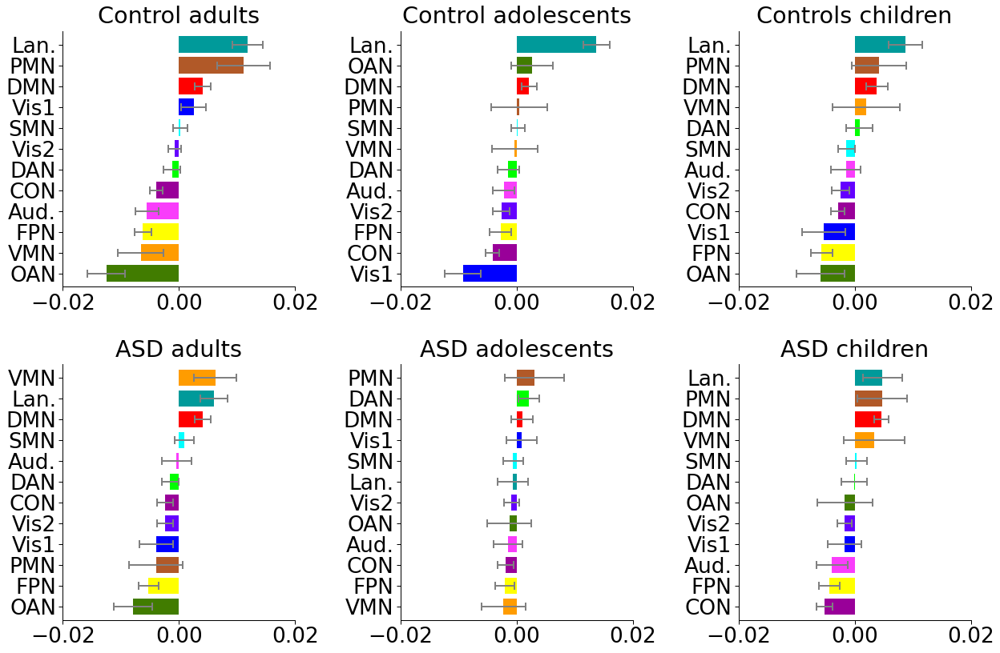

In [ ]:
fu.plot_network_age(mean, ste, 0, '../figures/mean_intra_g1.png')

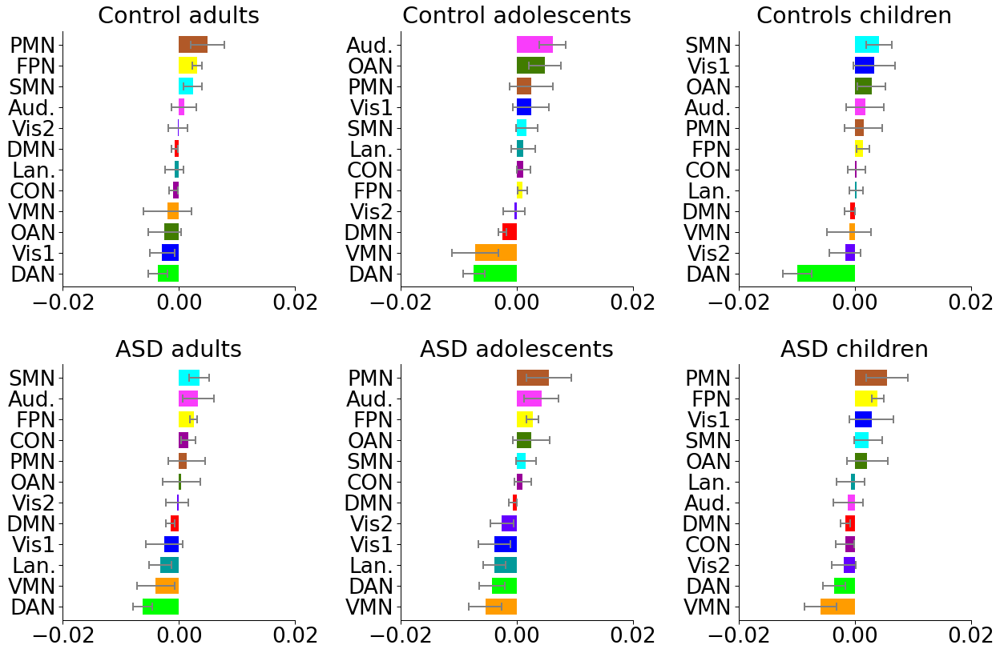

In [ ]:
fu.plot_network_age(mean, ste, 1, '../figures/mean_intra_g2.png')

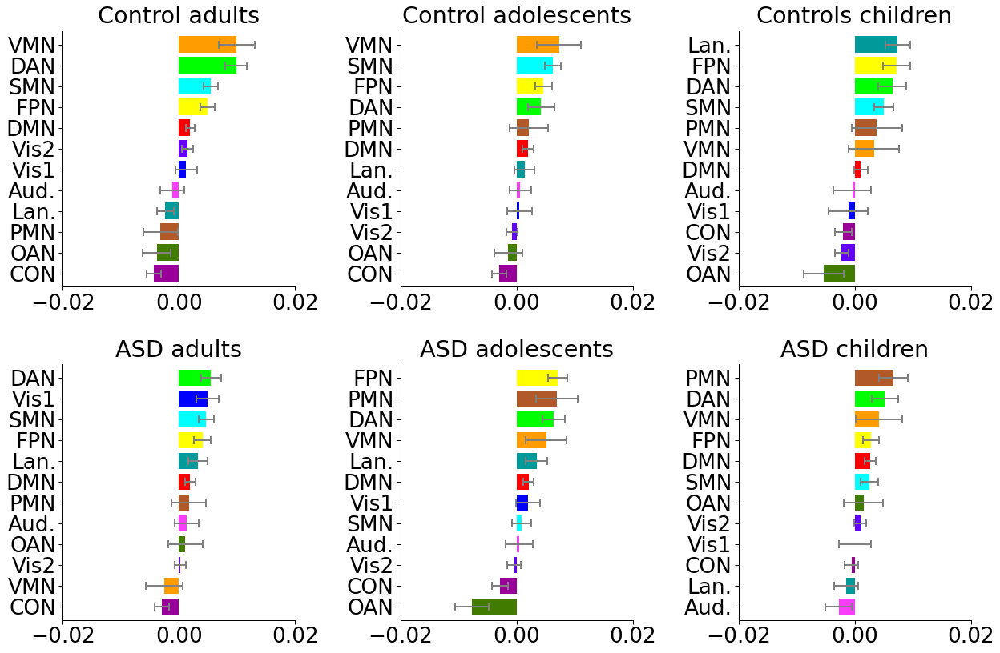

In [ ]:
fu.plot_network_age(mean, ste, 2, '../figures/mean_intra_g3.png')

## inter

### stats

In [ ]:
path = '../results/grad/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [ ]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T)

In [ ]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [ ]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-3.091426815298699,
 2.7930140661538583,
 -2.233586253558942,
 3.4897094811619147,
 -3.09224492998797,
 3.055364022643635,
 0.11441844886732985,
 3.8022146170809568)

In [ ]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(0.0021935311206868124,
 0.0005617871746909705,
 0.0021876965132861083,
 8.808369342949125e-05)

In [ ]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(), fdr(p_g123).min()

(0.33565581364881686,
 0.10112169144437469,
 0.22188854223452886,
 0.009806861306446259)

In [ ]:
p_g1[p_g1>boff] = 1
p_g2[p_g2>boff] = 1
p_g3[p_g3>boff] = 1
a = fdr(p_g123)
a[a>0.05]=1
np.savetxt('../results/interact_t_p_g1g2g3_pdfr123_inter.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [ ]:
t_g1[np.logical_or(p_g1>boff,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>boff,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>boff,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

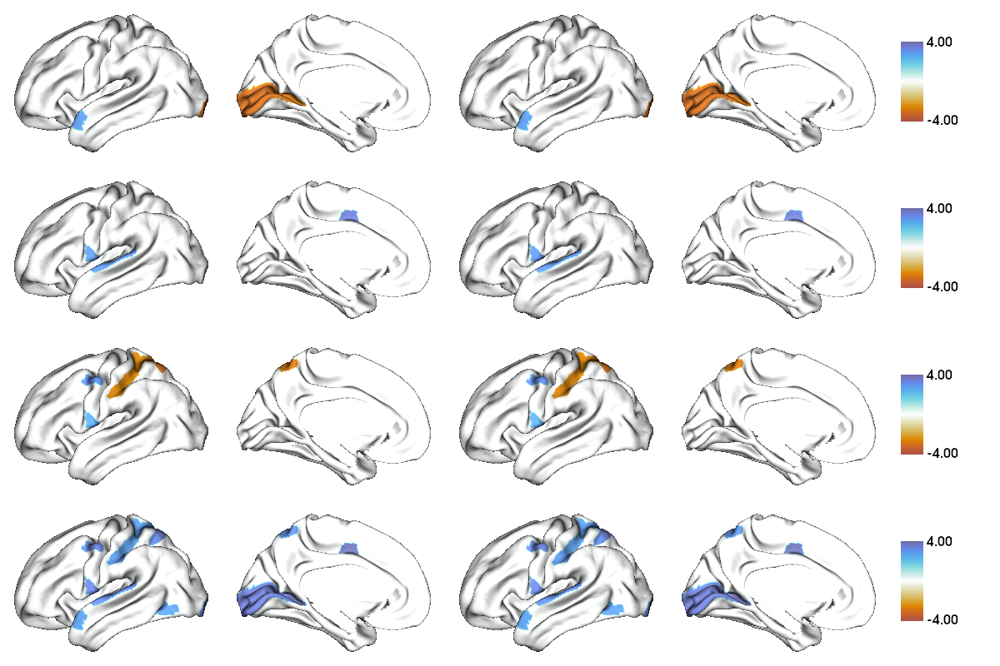

In [ ]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/interact_t_inter.png')

In [ ]:
mean = np.zeros((6,180,3))
sd = np.zeros((6,180,3))
for j in range(6):
  for i in range(180):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()

In [ ]:
t_pfdr(0, 3, 180,  'group', 'inter_adult_con_asd')
t_pfdr(1, 4, 180, 'group', 'inter_adol_con_asd')
t_pfdr(2, 5, 180, 'group', 'inter_kid_con_asd')
t_pfdr(0, 1, 180, 'age', 'inter_con_adult_adol')
t_pfdr(0, 2, 180, 'age', 'inter_con_adult_kid')
t_pfdr(1, 2, 180, 'age', 'inter_con_adol_kid')
t_pfdr(3, 4, 180, 'age', 'inter_asd_adult_adol')
t_pfdr(3, 5, 180, 'age', 'inter_asd_adult_kid')
t_pfdr(4, 5, 180, 'age', 'inter_asd_adol_kid')

Finish saving inter_adult_con_asd
Finish saving inter_adol_con_asd
Finish saving inter_kid_con_asd
Finish saving inter_con_adult_adol
Finish saving inter_con_adult_kid
Finish saving inter_con_adol_kid
Finish saving inter_asd_adult_adol
Finish saving inter_asd_adult_kid
Finish saving inter_asd_adol_kid


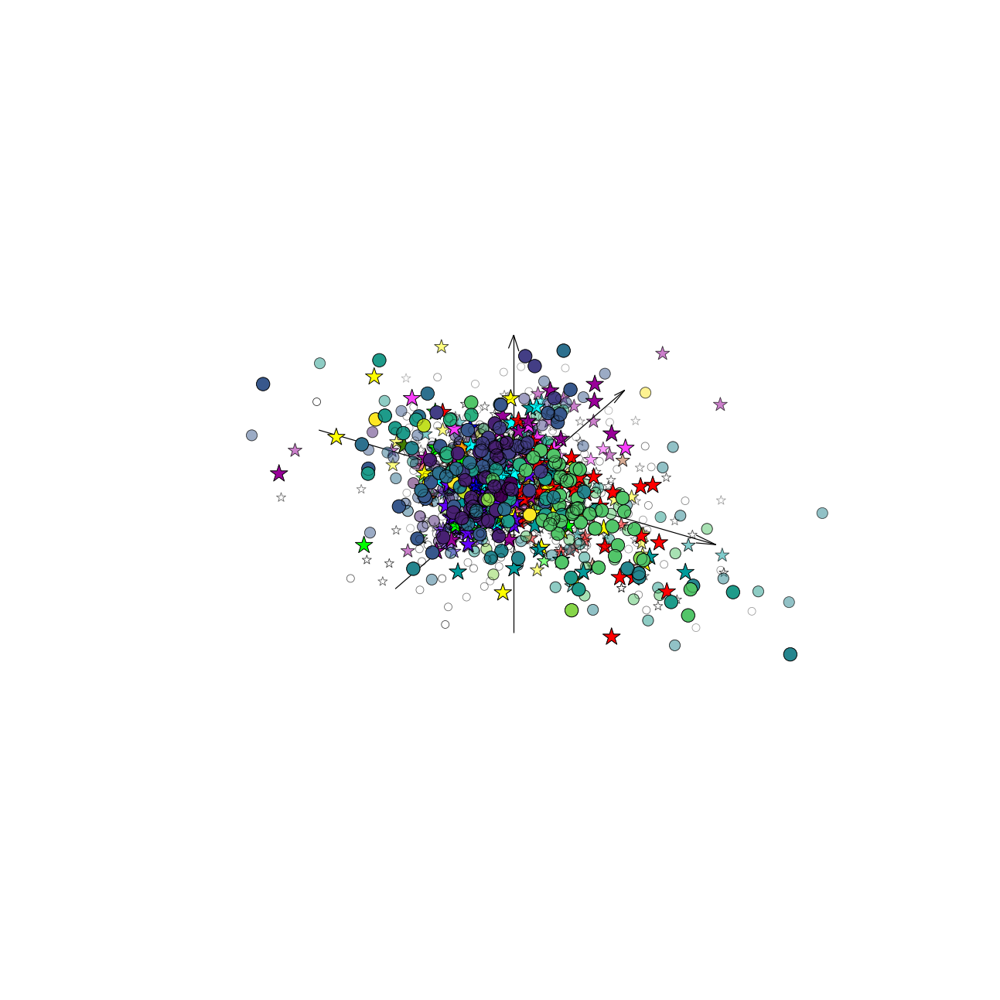

In [ ]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.04, 0.04)
ax.set_ylim(-0.04, 0.04)
ax.set_zlim(-0.04, 0.04)
ax.set_xticks(np.arange(-0.04,0.04,0.02))
ax.set_yticks(np.arange(-0.04,0.04,0.02))
ax.set_zticks(np.arange(-0.04,0.04,0.02))
ax._axis3don = False
x, y, z = np.array([[-0.03,0,0],[0,-0.03,0],[0,0,-0.03]])
u, v, w = np.array([[0.06,0,0],[0,0.06,0],[0,0,0.06]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = color, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = color, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = [0,0,0,0], cmap=cmap, marker = '*')
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/age_dx_mean_inter_3d.png', dpi=300, transparent=True)

### parcel-wise

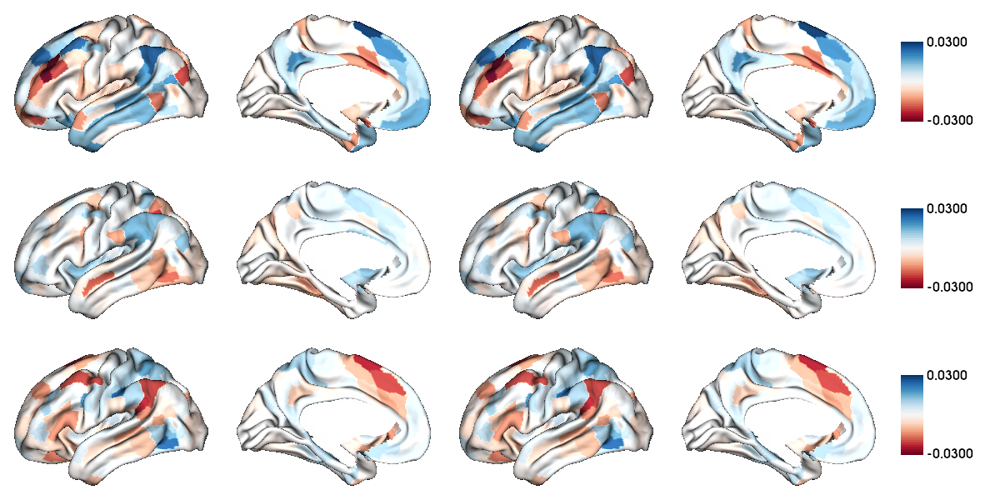

In [ ]:
fu.plot_mean_save_sd(mean, sd, 0, 'control_adult_inter')

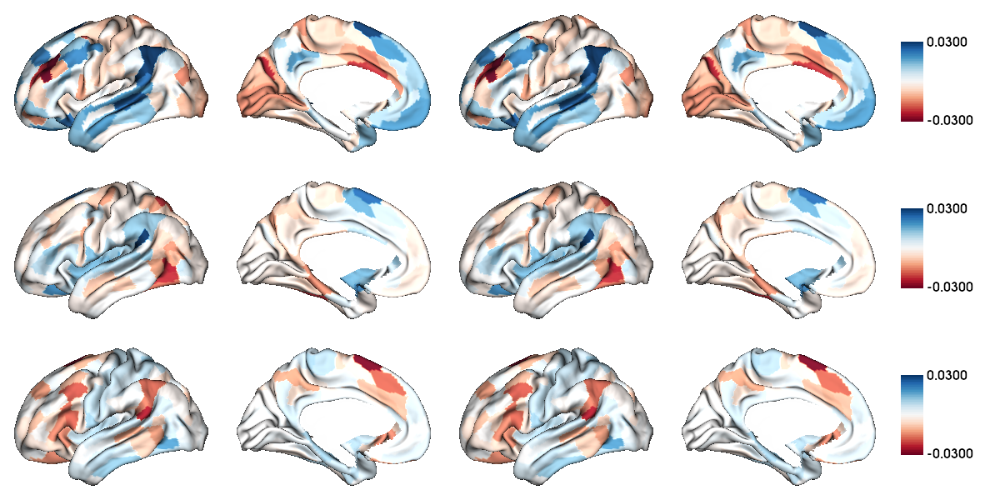

In [ ]:
fu.plot_mean_save_sd(mean, sd, 1, 'control_adol_inter')

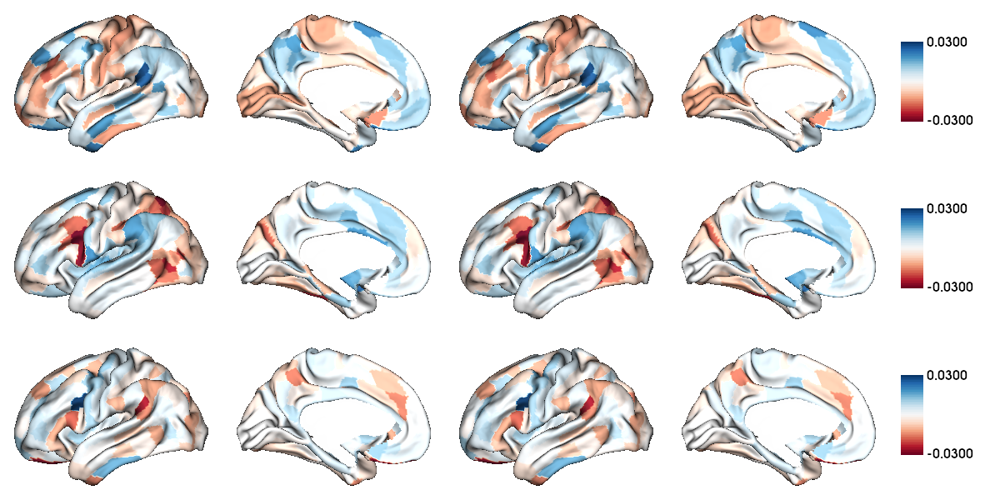

In [ ]:
fu.plot_mean_save_sd(mean, sd, 2, 'control_kid_inter')

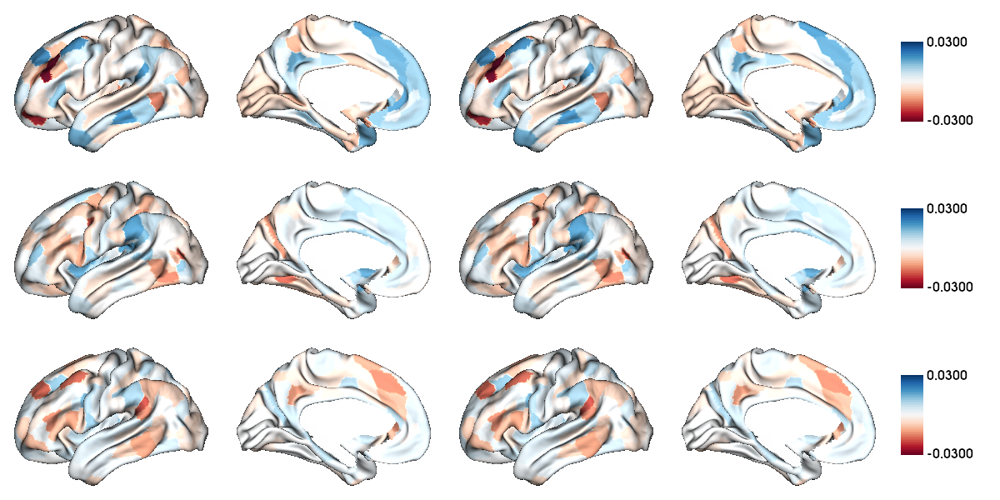

In [ ]:
fu.plot_mean_save_sd(mean, sd, 3, 'asd_adult_inter')

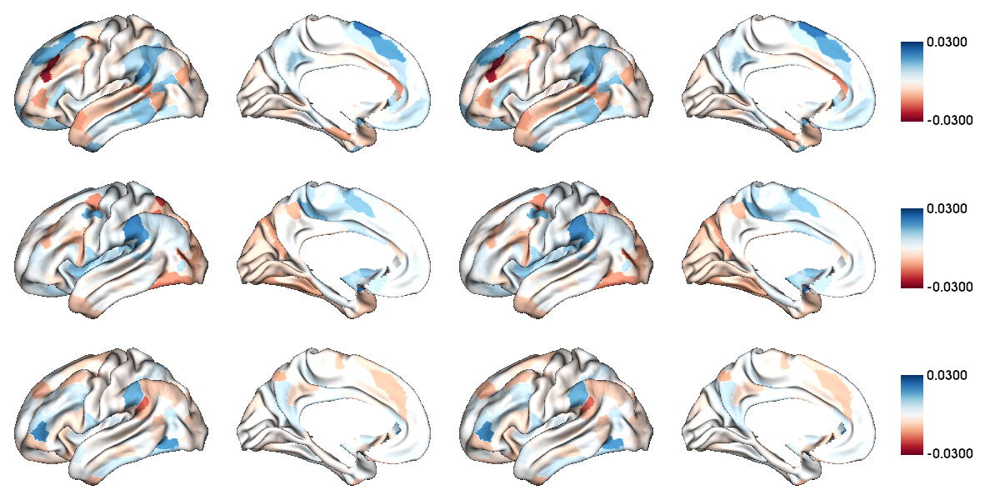

In [ ]:
fu.plot_mean_save_sd(mean, sd, 4, 'asd_adol_inter')

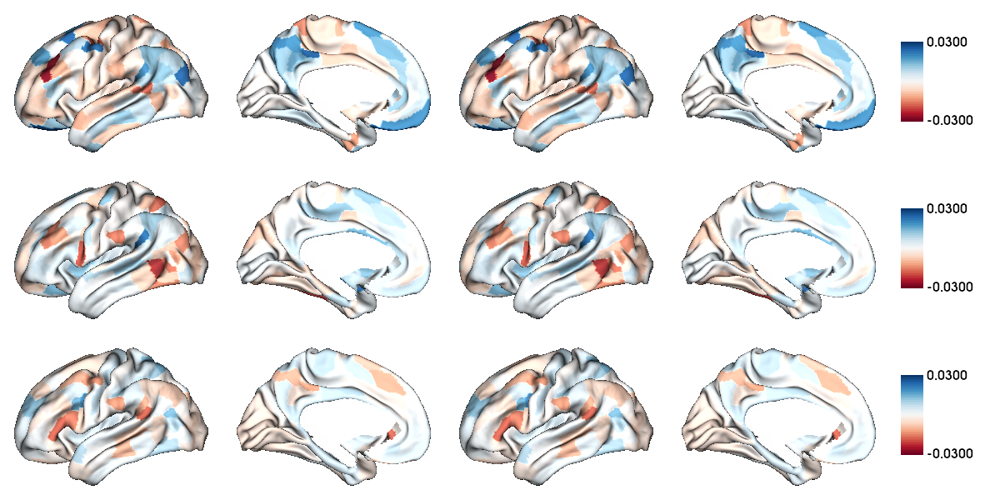

In [ ]:
fu.plot_mean_save_sd(mean, sd, 5, 'asd_kid_inter')

### correlation

In [ ]:
data = [np.genfromtxt('../results/mean_control_adult_inter.csv'),
        np.genfromtxt('../results/mean_control_adol_inter.csv'),
        np.genfromtxt('../results/mean_control_kid_inter.csv'),
        np.genfromtxt('../results/mean_asd_adult_inter.csv'),
        np.genfromtxt('../results/mean_asd_adol_inter.csv'),
        np.genfromtxt('../results/mean_asd_kid_inter.csv')]

In [ ]:
hcp_inter = np.loadtxt('../../evolution/results/gradient/mean_asym_LRRL.csv', delimiter=',')
[ss.pearsonr(hcp_inter[:,0], data[0][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[0][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[0][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[1][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[1][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[1][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[2][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[2][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[2][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[3][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[3][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[3][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[4][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[4][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[4][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[5][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[5][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[5][:,2])]

[(0.49875476142693054, 1.0368612873191643e-12),
 (0.46980175863420454, 2.8648475422869222e-11),
 (0.6437879282885641, 1.8896250843360812e-22),
 (0.42190930762893963, 3.66126404392904e-09),
 (0.25756821512059536, 0.000481849316674962),
 (0.5901495987166872, 2.833945288819584e-18),
 (0.41011944006414053, 1.0808727767735144e-08),
 (0.39168720933683554, 5.4107090678350205e-08),
 (0.3921590892135996, 5.1984407186677404e-08),
 (0.4899229257162635, 2.9500164013660192e-12),
 (0.3049074294019367, 3.1574771417233605e-05),
 (0.5509248025760247, 1.1184812344486856e-15),
 (0.3963585196800297, 3.630694535323459e-08),
 (0.3265188622813006, 7.697953014847516e-06),
 (0.45553414399634234, 1.3158464742392895e-10),
 (0.4707743473106908, 2.5754000191625773e-11),
 (0.3180884427158459, 1.3525084377175333e-05),
 (0.45664784462192376, 1.171159023463023e-10)]

In [ ]:
# g1
spin_con_asd_inter_adult = fu.spin_pearson_pair(hcp_inter[:,0], data[0][:,0], data[3][:,0])
spin_con_asd_inter_adol = fu.spin_pearson_pair(hcp_inter[:,0], data[1][:,0], data[4][:,0])
spin_con_asd_inter_kid = fu.spin_pearson_pair(hcp_inter[:,0], data[2][:,0], data[5][:,0])
[spin_con_asd_inter_adult.spin_p1, spin_con_asd_inter_adult.spin_p2,
 spin_con_asd_inter_adol.spin_p1, spin_con_asd_inter_adol.spin_p2,
 spin_con_asd_inter_kid.spin_p1, spin_con_asd_inter_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [ ]:
# g2
spin_con_asd_inter_adult = fu.spin_pearson_pair(hcp_inter[:,1], data[0][:,1], data[3][:,1])
spin_con_asd_inter_adol = fu.spin_pearson_pair(hcp_inter[:,1], data[1][:,1], data[4][:,1])
spin_con_asd_inter_kid = fu.spin_pearson_pair(hcp_inter[:,1], data[2][:,1], data[5][:,1])
[spin_con_asd_inter_adult.spin_p1, spin_con_asd_inter_adult.spin_p2,
 spin_con_asd_inter_adol.spin_p1, spin_con_asd_inter_adol.spin_p2,
 spin_con_asd_inter_kid.spin_p1, spin_con_asd_inter_kid.spin_p2]

[0.0, 0.008, 0.075, 0.014, 0.001, 0.003]

In [ ]:
# g3
spin_con_asd_inter_adult = fu.spin_pearson_pair(hcp_inter[:,2], data[0][:,2], data[3][:,2])
spin_con_asd_inter_adol = fu.spin_pearson_pair(hcp_inter[:,2], data[1][:,2], data[4][:,2])
spin_con_asd_inter_kid = fu.spin_pearson_pair(hcp_inter[:,2], data[2][:,2], data[5][:,2])
[spin_con_asd_inter_adult.spin_p1, spin_con_asd_inter_adult.spin_p2,
 spin_con_asd_inter_adol.spin_p1, spin_con_asd_inter_adol.spin_p2,
 spin_con_asd_inter_kid.spin_p1, spin_con_asd_inter_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [ ]:
[res(hcp_inter[:,0], data[0][:,0]),
 res(hcp_inter[:,1], data[0][:,1]),
 res(hcp_inter[:,2], data[0][:,2]),
 res(hcp_inter[:,0], data[1][:,0]),
 res(hcp_inter[:,1], data[1][:,1]),
 res(hcp_inter[:,2], data[1][:,2]),
 res(hcp_inter[:,0], data[2][:,0]),
 res(hcp_inter[:,1], data[2][:,1]),
 res(hcp_inter[:,2], data[2][:,2]),
 res(hcp_inter[:,0], data[3][:,0]),
 res(hcp_inter[:,1], data[3][:,1]),
 res(hcp_inter[:,2], data[3][:,2]),
 res(hcp_inter[:,0], data[4][:,0]),
 res(hcp_inter[:,1], data[4][:,1]),
 res(hcp_inter[:,2], data[4][:,2]),
 res(hcp_inter[:,0], data[5][:,0]),
 res(hcp_inter[:,1], data[5][:,1]),
 res(hcp_inter[:,2], data[5][:,2])]

[BootstrapResult(confidence_interval=ConfidenceInterval(low=0.3641946105082119, high=0.6092964509304378), standard_error=0.06251608001455304),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.2868360567046382, high=0.601550767486897), standard_error=0.07847486489344946),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5365705263516748, high=0.7200117531948426), standard_error=0.045663177805073105),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.26961845095772374, high=0.5373946848433742), standard_error=0.06680531549067689),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.08359540093169879, high=0.4208369711973109), standard_error=0.0865206021576146),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.4826144531492238, high=0.676135217958325), standard_error=0.04858980158382245),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.28017375317331383, high=0.5288838643666203), standard_error=0.06334740472986426)

### network-wise

In [ ]:
path = '../results/grad/network/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [ ]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(matrix_total)

In [ ]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [ ]:
t_g1, t_g2, t_g3, t_g123

(array([-2.25984473, -0.26990923, -0.48579433,  1.60685264,  1.22181261,
         0.26572029,  0.05572963,  1.09778532, -0.79400265, -1.40548725,
         1.42337326, -0.23174525]),
 array([ 0.59630719, -0.51950911, -0.00895856,  1.81771409, -1.39769058,
        -0.6197908 , -1.43171196,  1.93313343,  0.15538167,  0.23636813,
         0.54712881,  0.58071795]),
 array([ 1.54019444, -1.95307552, -0.7101868 ,  1.34016911, -1.75619604,
         2.05655183,  0.1847952 ,  0.0736832 ,  1.38813784,  0.03401249,
        -1.00324269,  1.21122975]),
 array([2.89457262, 2.14988812, 0.8810224 , 2.76567394, 2.41862761,
        2.25221518, 1.49151514, 2.04177622, 1.68346906, 1.47839113,
        1.76318654, 1.38607306]))

In [ ]:
p_g1, p_g2, p_g3, p_g123

(array([0.02460216, 0.78742961, 0.62749429, 0.10921781, 0.22280981,
        0.79065088, 0.95559709, 0.27324475, 0.42786869, 0.160989  ,
        0.15574525, 0.81690576]),
 array([0.55145353, 0.60381765, 0.9928586 , 0.07018032, 0.16331632,
        0.53590137, 0.15334554, 0.05423149, 0.87663279, 0.81332046,
        0.58472759, 0.56189933]),
 array([0.12464634, 0.05181019, 0.47818148, 0.18128074, 0.0801521 ,
        0.04065921, 0.85352393, 0.94131527, 0.1662025 , 0.97289151,
        0.31661309, 0.2268323 ]),
 array([0.00204833, 0.01621184, 0.18953201, 0.00302979, 0.00810971,
        0.0125431 , 0.06847804, 0.02105707, 0.04670142, 0.07021558,
        0.03948184, 0.08341568]))

In [ ]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.29522587, 1.        , 0.94124143, 0.65530686, 0.53474355,
        0.94878105, 0.95559709, 0.54648951, 0.73348919, 0.48296699,
        0.62298102, 0.89116992]),
 array([1.        , 0.8050902 , 0.9928586 , 0.42108194, 0.48994896,
        1.        , 0.61338218, 0.65077782, 0.95632668, 0.97598455,
        0.87709139, 0.96325599]),
 array([0.37393902, 0.31086116, 0.6375753 , 0.36256148, 0.32060842,
        0.48791051, 1.        , 1.        , 0.39888599, 0.97289151,
        0.47491963, 0.38885536]),
 array([0.02458001, 0.03890841, 0.18953201, 0.01817874, 0.03243882,
        0.03762929, 0.09130405, 0.04211414, 0.07005213, 0.0842587 ,
        0.06768316, 0.09099893]))

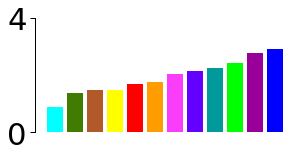

In [ ]:
fu.plot_t_single(t_g123, '../figures/ca_interact_inter_multiT.png')

In [ ]:
mean = np.zeros((6,12,3))
sd = np.zeros((6,12,3))
ste = np.zeros((6,12,3))
name = ['control_adult', 'control_adol', 'control_kid', 'asd_adult', 'asd_adol', 'asd_kid']
for j in range(6):
  for i in range(12):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])
  np.savetxt('../results/inter_mean_ca_'+name[j]+'.csv', mean[j])
  np.savetxt('../results/inter_sd_ca_'+name[j]+'.csv', sd[j])

In [ ]:
t_pfdr(0, 3, 12, 'group', 'ca_inter_adult_con_asd')
t_pfdr(1, 4, 12, 'group', 'ca_inter_adol_con_asd')
t_pfdr(2, 5, 12, 'group', 'ca_inter_kid_con_asd')
t_pfdr(0, 1, 12, 'age', 'ca_inter_con_adult_adol')
t_pfdr(0, 2, 12, 'age', 'ca_inter_con_adult_kid')
t_pfdr(1, 2, 12, 'age', 'ca_inter_con_adol_kid')
t_pfdr(3, 4, 12, 'age', 'ca_inter_asd_adult_adol')
t_pfdr(3, 5, 12, 'age', 'ca_inter_asd_adult_kid')
t_pfdr(4, 5, 12, 'age', 'ca_inter_asd_adol_kid')

Finish saving ca_inter_adult_con_asd
Finish saving ca_inter_adol_con_asd
Finish saving ca_inter_kid_con_asd
Finish saving ca_inter_con_adult_adol
Finish saving ca_inter_con_adult_kid
Finish saving ca_inter_con_adol_kid
Finish saving ca_inter_asd_adult_adol
Finish saving ca_inter_asd_adult_kid
Finish saving ca_inter_asd_adol_kid


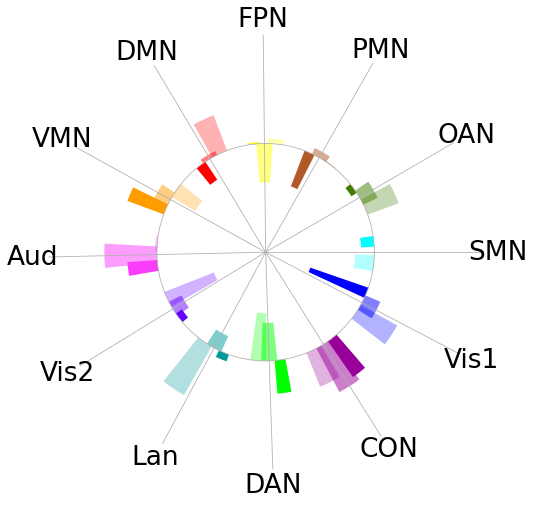

In [ ]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/ca_interact_inter_t_g123.png')

In [ ]:
[np.where(np.logical_and(p_g1<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g2<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g3<0.05, fdr(p_g123)<0.05))[0]]

[array([0]), array([], dtype=int64), array([5])]

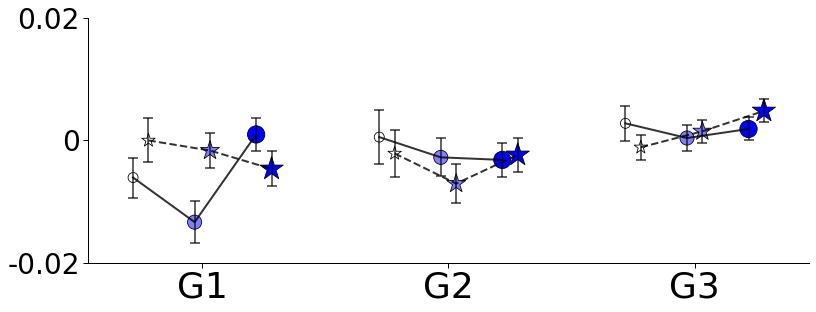

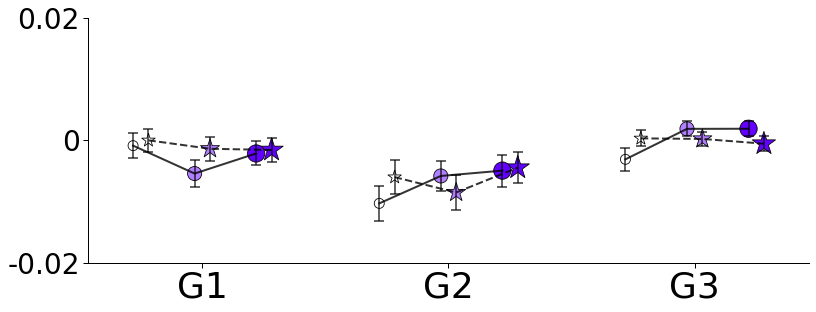

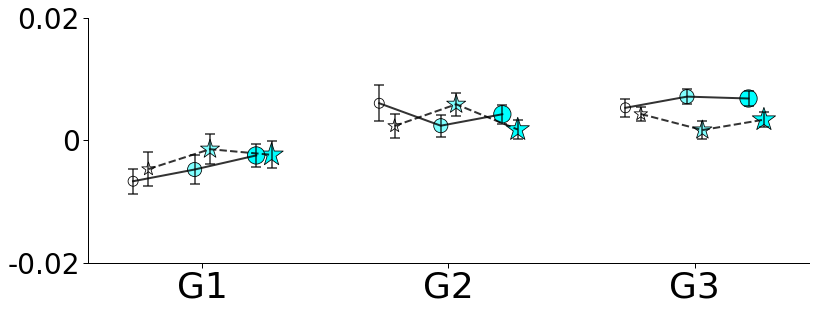

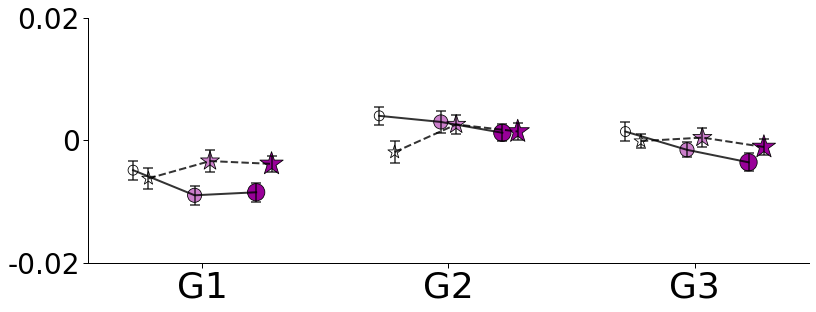

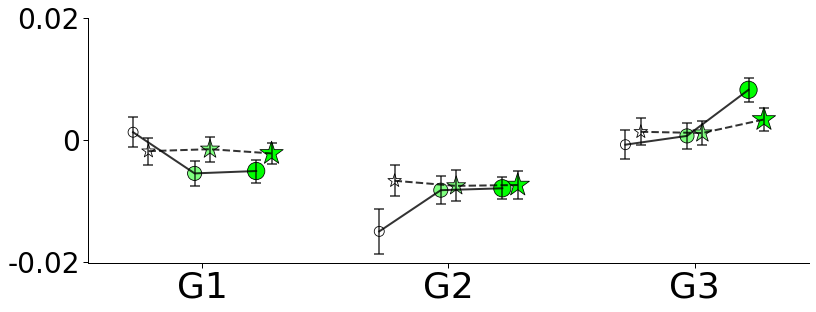

...

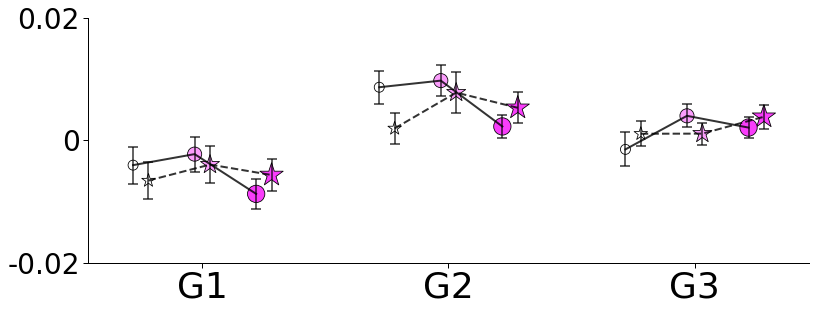

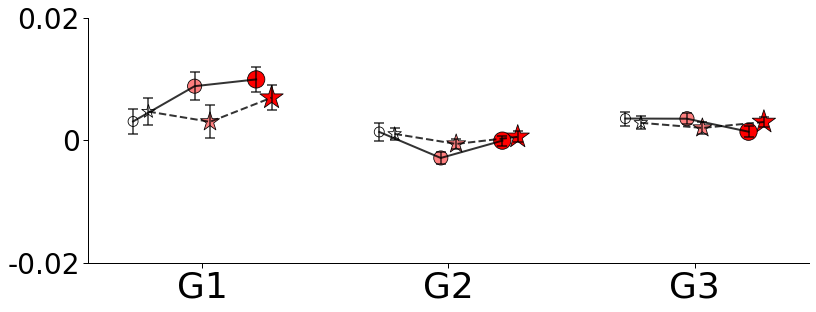

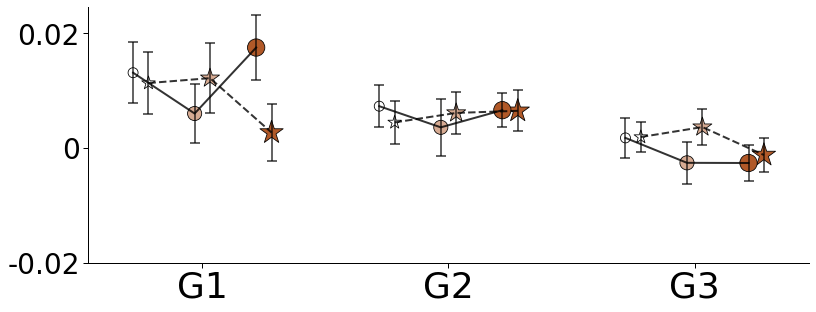

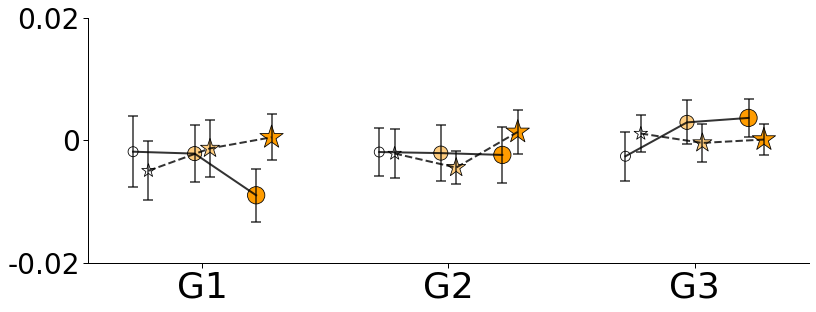

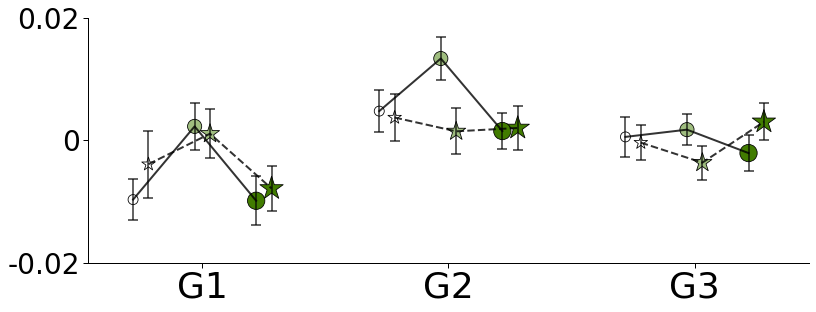

In [ ]:
for i in range (12):
  fu.plot_interact(mean, ste, i, 'inter')

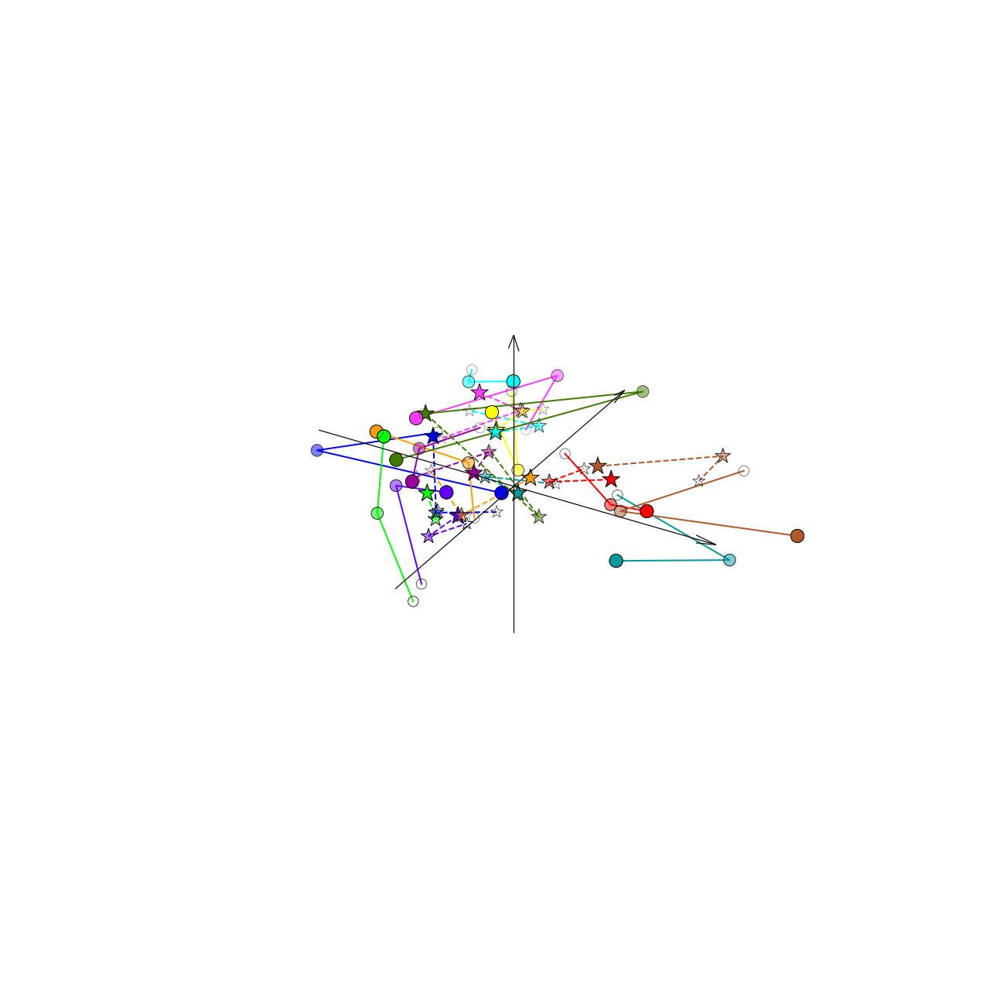

In [ ]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.02, 0.02)
ax.set_ylim(-0.02, 0.02)
ax.set_zlim(-0.02, 0.02)
ax.set_xticks(np.arange(-0.02,0.02,0.01))
ax.set_yticks(np.arange(-0.02,0.02,0.01))
ax.set_zticks(np.arange(-0.02,0.02,0.01))
ax._axis3don = False
x, y, z = np.array([[-0.015,0,0],[0,-0.015,0],[0,0,-0.015]])
u, v, w = np.array([[0.03,0,0],[0,0.03,0],[0,0,0.03]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-60*i, c = fu.rgb, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-140*i, c = fu.rgb, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-60*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-140*i, c = [0,0,0,0], cmap=cmap, marker = '*')
for i in range(12):             
  ax.plot(mean[:3][:,i][:,0], mean[:3][:,i][:,1], mean[:3][:,i][:,2],
          color=fu.rgb[i], ls='-', lw=2)
  ax.plot(mean[3:][:,i][:,0], mean[3:][:,i][:,1], mean[3:][:,i][:,2],
          color=fu.rgb[i], ls='--', lw=2)        
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/age_dx_mean_inter_3d_ca.png', dpi=300, transparent=True)

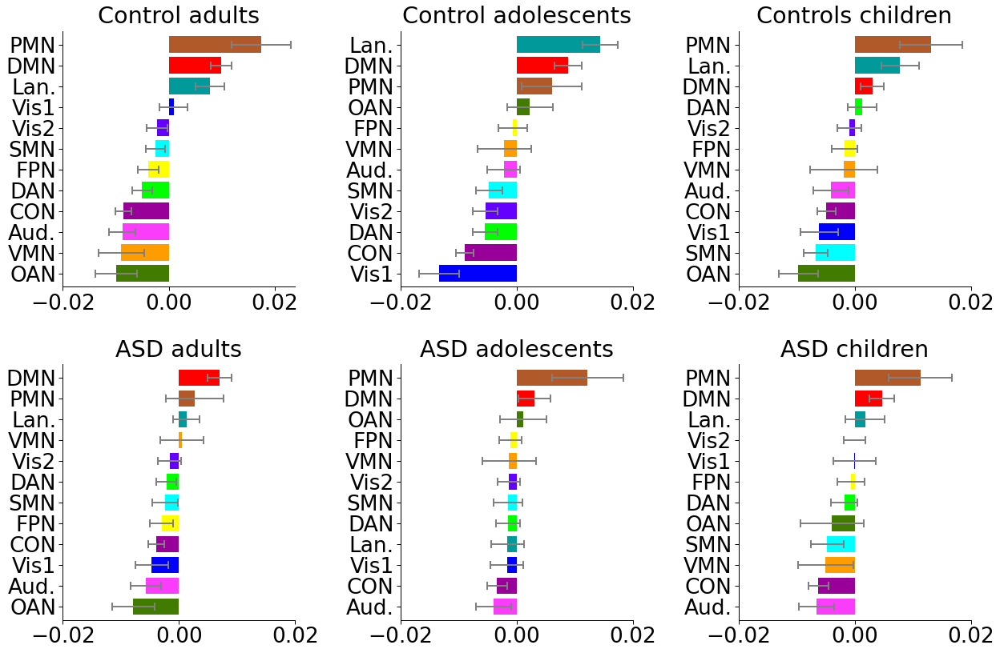

In [ ]:
fu.plot_network_age(mean, ste, 0, '../figures/mean_inter_g1.png')

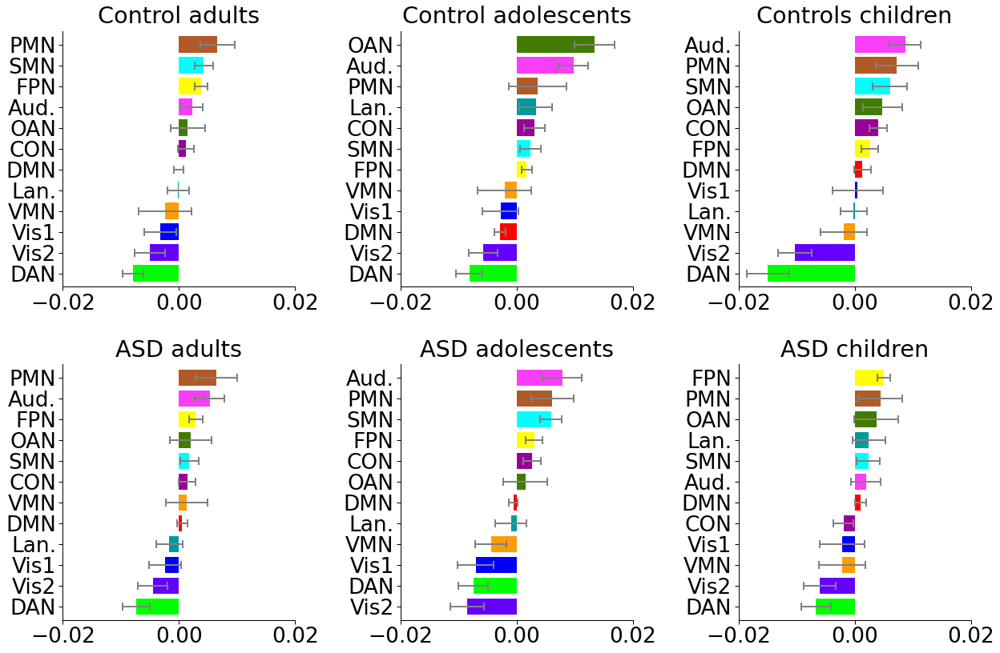

In [ ]:
fu.plot_network_age(mean, ste, 1, '../figures/mean_inter_g2.png')

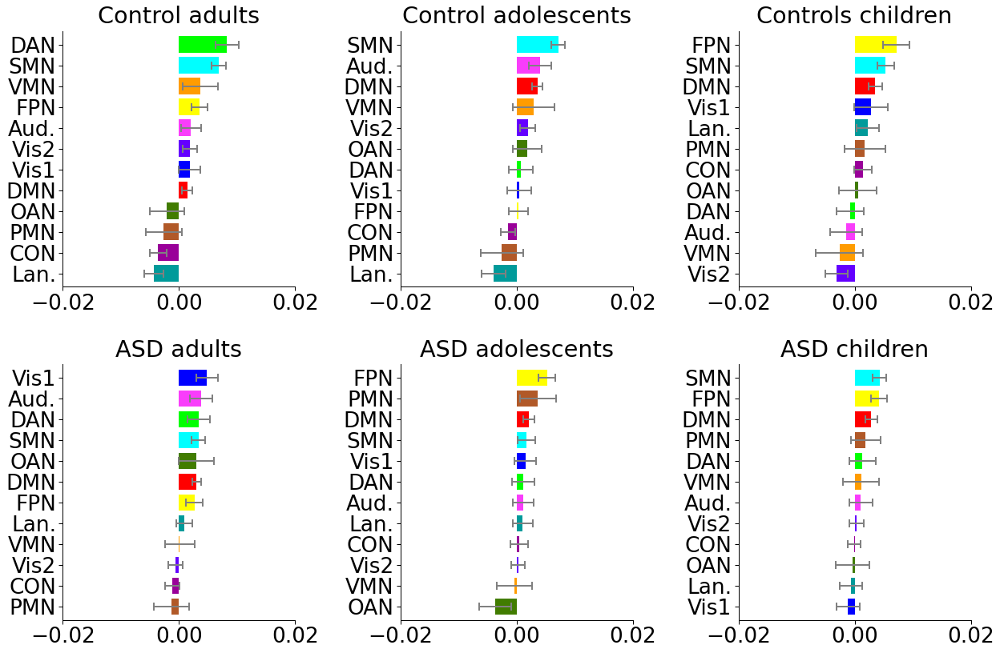

In [ ]:
fu.plot_network_age(mean, ste, 2, '../figures/mean_inter_g3.png')

## Brain net

In [ ]:
name = ['Vis1', 'Vis2', 'SMN', 'CON', 'DAN', 'Lan', 'FPN', 'Aud', 'DMN', 'PMN', 'VMN', 'OAN']

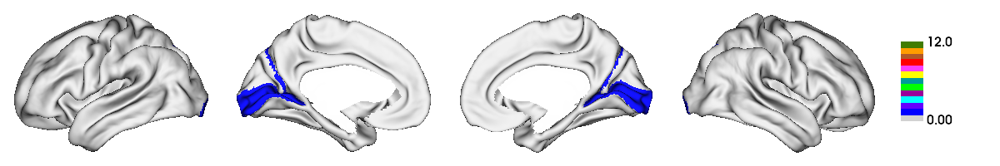

In [ ]:
num = 1
net = ca.copy()
net[net != num] = -1
mask = fu.mmp_lr != 0
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                   filename='../figures/brain_'+name[num-1]+'.png')

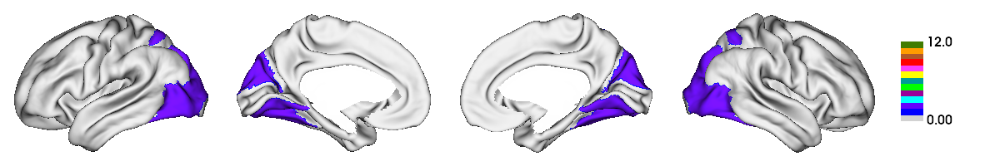

In [ ]:
num = 2
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                   filename='../figures/brain_'+name[num-1]+'.png')

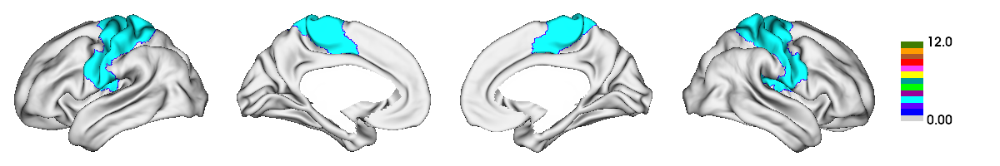

In [ ]:
num = 3
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

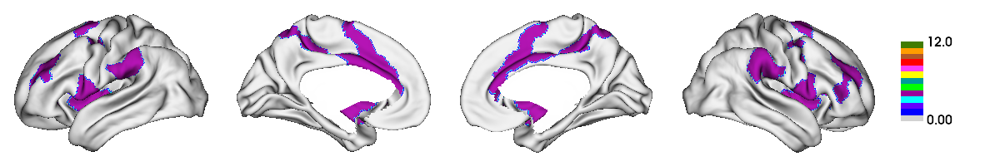

In [ ]:
num = 4
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

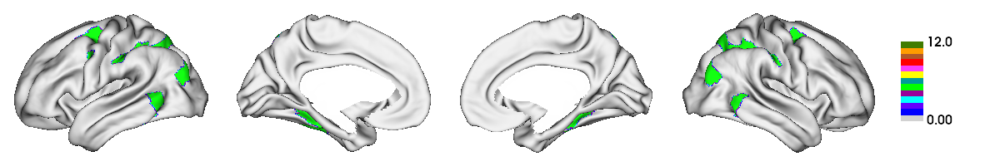

In [ ]:
num = 5
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                   filename='../figures/brain_'+name[num-1]+'.png')

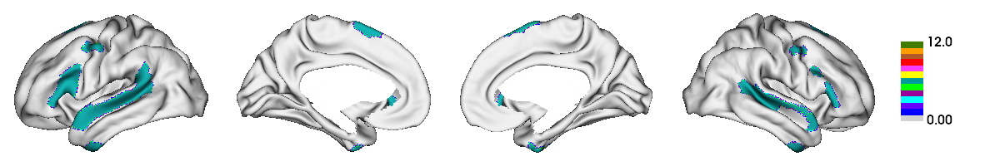

In [ ]:
num = 6
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

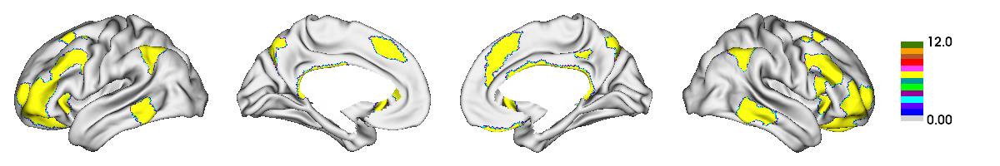

In [ ]:
num = 7
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

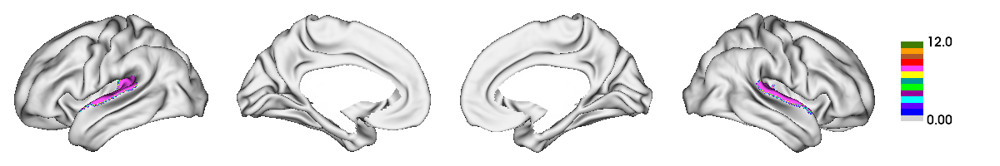

In [ ]:
num = 8
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

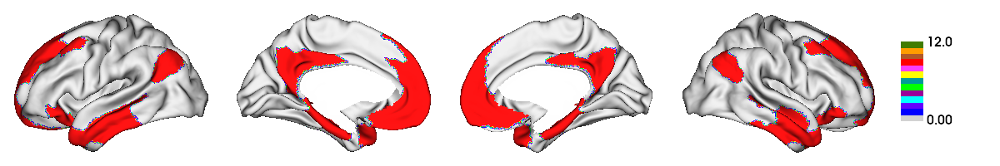

In [ ]:
num = 9
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

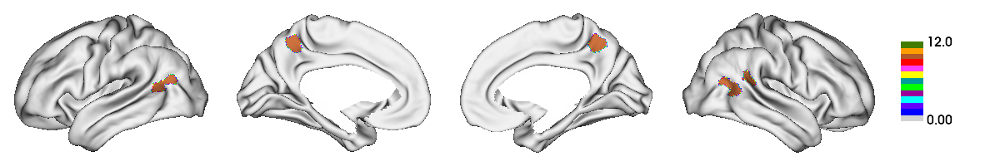

In [ ]:
num = 10
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

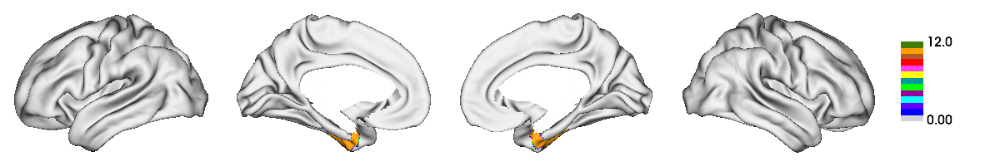

In [ ]:
num = 11
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')

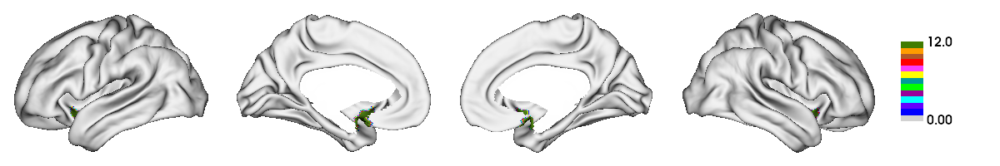

In [ ]:
num = 12
net = ca.copy()
net[net != num] = -1
grad = map_to_labels(net, fu.mmp_lr, mask=mask)
grad[grad==0]=np.nan
grad[grad==-1]=0

fu.plot_surface_lr(data=grad, size=(1200,200), cmap=cmap_brain, color_range=(0, 12), 
                filename='../figures/brain_'+name[num-1]+'.png')